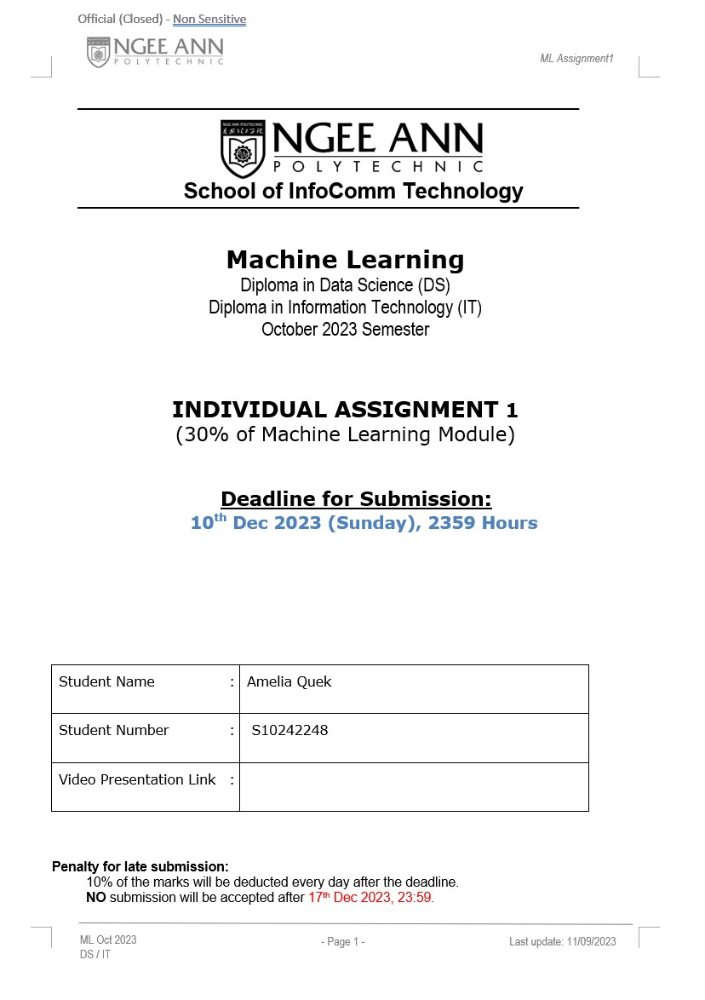


# Table Of Contents

## 1. [HR Analytics](#part1)
   - [1.1. Load and Explore the Data](#part1.1)
   - [1.2. Cleanse and Transform the data](#part1.2)
   - [1.3. Correlation Analysis](#part1.3)
   - [1.4. Export the data](#part1.4)
   
 ## 2. [Airbnb](#part2)
   - [2.1. Load and Explore the Data](#part2.1)
   - [2.2. Cleanse and Transform the data](#part2.2)
   - [2.3. Correlation Analysis](#part2.3)
   - [2.4. Export the data](#part2.4)

In [1]:
# import the required packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from datetime import datetime

from feature_engine.outliers import Winsorizer
from feature_engine.transformation import YeoJohnsonTransformer

from feature_engine.encoding import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from scipy.stats import chi2_contingency
from feature_engine.discretisation import EqualWidthDiscretiser
from scipy.stats import ttest_ind
from scipy.stats import pointbiserialr
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
from scipy.stats import chi2_contingency

In [2]:
def diagnostic_plots(df, variable):
    # Set Seaborn style
    sns.set(style="whitegrid")
    
    # Create a figure with subplots
    plt.figure(figsize=(18, 8))

    # Histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable],bins=20, kde=True, color='#AF6FAB')
    plt.title('Histogram')
    
    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.title('Q-Q Plot')
    
    # Boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable], palette=sns.color_palette("mako")[::-1])
    plt.title('Boxplot')
    
    # Adjust layout
    plt.tight_layout()
    
    # Show the plots
    plt.show()

In [3]:
palette = sns.color_palette("cubehelix", 8)[::-1]

## 1. HR Analytics <a id="part1"></a>

### 1.1 Load and Explore the data  <a id="part1.1"></a>

In [4]:
hr_data = pd.read_csv('./hr_data.csv')

In [5]:
hr_data.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0


In [6]:
hr_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


In [7]:
## DATA UNDERSTANDING 

In [8]:
# Categorical columns

In [9]:
# Ordinal

Ordinal Data: Categorical data with natural, ordered categories

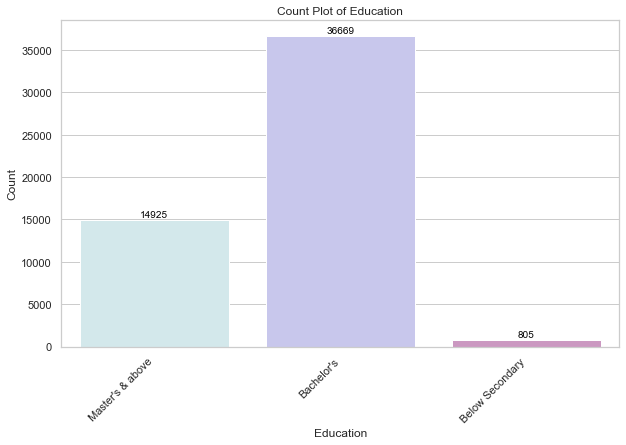

In [10]:
sns.set(style="whitegrid")

# Create a count plot with slanted x-axis labels
plt.figure(figsize=(10, 6))
ax = sns.countplot(data=hr_data, x='education', palette=palette)

# Rotate x-axis labels
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# Add data labels to each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='top', xytext=(0, 10), textcoords='offset points', fontsize=10, color='black')

# Add title and labels
plt.title('Count Plot of Education')
plt.xlabel('Education')
plt.ylabel('Count')

# Show the plot
plt.show()

In [11]:
# Nominal

Nominal Data: Does not have natural, ordered categories

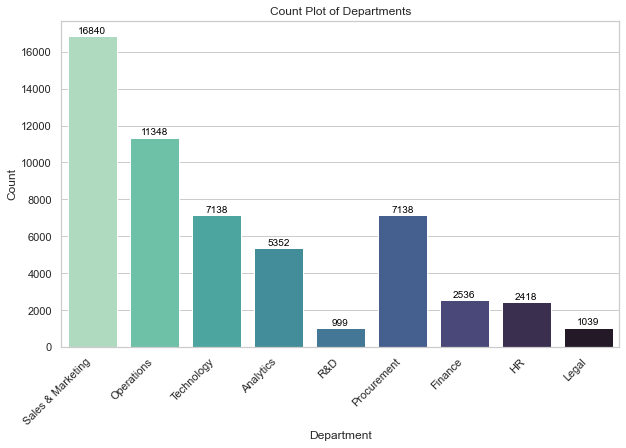

In [12]:
# Create a count plot with slanted x-axis labels
plt.figure(figsize=(10, 6))
ax = sns.countplot(data=hr_data, x='department', palette=sns.color_palette("mako", n_colors=len(hr_data['department'].unique()))[::-1])

# Rotate x-axis labels
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='top', xytext=(0, 10), textcoords='offset points', fontsize=10, color='black')

# Add title and labels
plt.title('Count Plot of Departments')
plt.xlabel('Department')
plt.ylabel('Count')

# Show the plot
plt.show()

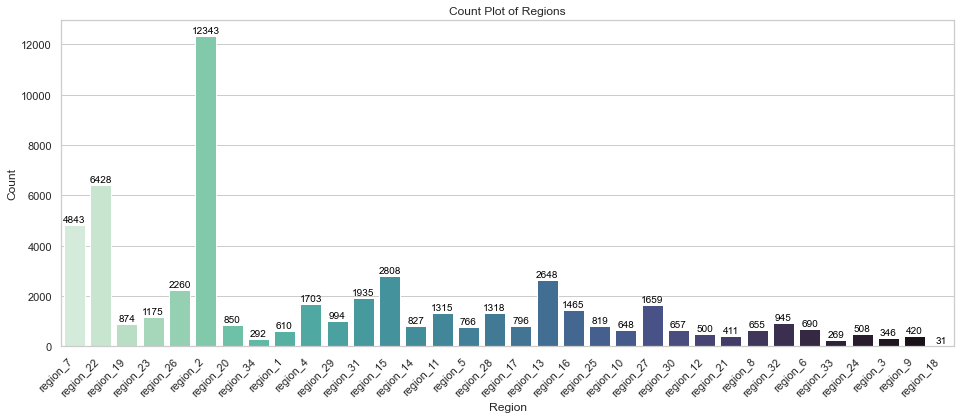

In [13]:
sns.set(style="whitegrid")

# Create a count plot with slanted x-axis labels
plt.figure(figsize=(16, 6))
ax = sns.countplot(data=hr_data, x='region', palette=sns.color_palette("mako", n_colors=len(hr_data['region'].unique()))[::-1])

# Rotate x-axis labels
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# Annotate the bars with their heights
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='top', xytext=(0, 10), textcoords='offset points', fontsize=10, color='black')

# Add title and labels
plt.title('Count Plot of Regions')
plt.xlabel('Region')
plt.ylabel('Count')

# Show the plot
plt.show()

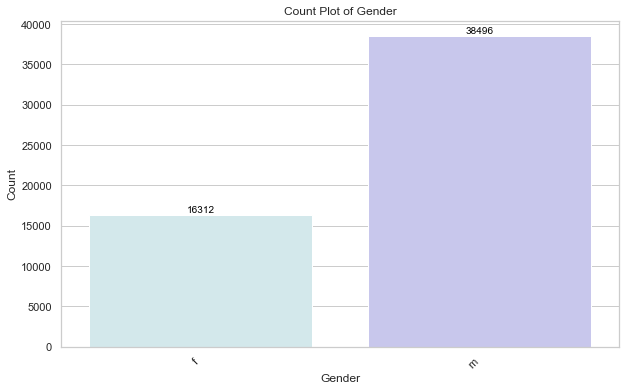

In [14]:
sns.set(style="whitegrid")

# Create a count plot with slanted x-axis labels
plt.figure(figsize=(10, 6))
ax = sns.countplot(data=hr_data, x='gender', palette=palette)

# Rotate x-axis labels
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# Add data labels to each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='top', xytext=(0, 10), textcoords='offset points', fontsize=10, color='black')

# Add title and labels
plt.title('Count Plot of Gender')
plt.xlabel('Gender')
plt.ylabel('Count')

# Show the plot
plt.show()


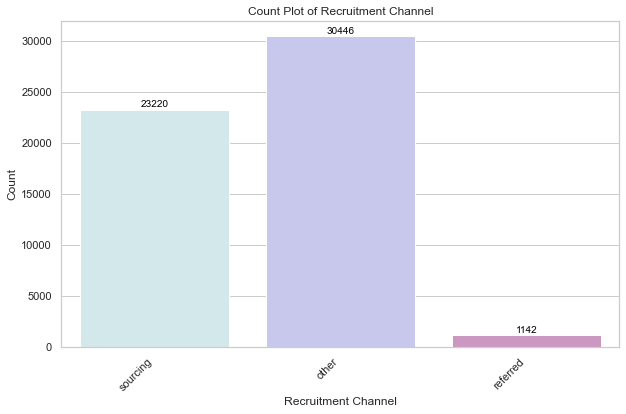

In [15]:
sns.set(style="whitegrid")

# Create a count plot with slanted x-axis labels
plt.figure(figsize=(10, 6))
ax = sns.countplot(data=hr_data, x='recruitment_channel', palette=palette)

# Rotate x-axis labels
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='top', xytext=(0, 10), textcoords='offset points', fontsize=10, color='black')
    
# Add title and labels
plt.title('Count Plot of Recruitment Channel')
plt.xlabel('Recruitment Channel')
plt.ylabel('Count')

# Show the plot
plt.show()

In [16]:
# Numerical columns

In [17]:
## continuous columns

Continuous data: data that can take any value.

In [18]:
### statistical approach

In [19]:
hr_data[['no_of_trainings','age','length_of_service','avg_training_score']].describe()

,no_of_trainings,age,length_of_service,avg_training_score
count,54808.000000,54808.000000,54808.000000,54808.000000
mean,1.253011,34.803915,5.865512,63.386750
std,0.609264,7.660169,4.265094,13.371559
min,1.000000,20.000000,1.000000,39.000000
25%,1.000000,29.000000,3.000000,51.000000
50%,1.000000,33.000000,5.000000,60.000000
75%,1.000000,39.000000,7.000000,76.000000
max,10.000000,60.000000,37.000000,99.000000


In [20]:
range_no_of_trainings = np.max(hr_data['no_of_trainings']) - np.min(hr_data['no_of_trainings'])
range_age = np.max(hr_data['age']) - np.min(hr_data['age'])
range_length_of_service = np.max(hr_data['length_of_service']) - np.min(hr_data['length_of_service'])
range_avg_training_score = np.max(hr_data['avg_training_score']) - np.min(hr_data['avg_training_score'])

print(f"Range No. of Trainings: {range_no_of_trainings}")
print(f"Range Age: {range_age}")
print(f"Range Length of Service: {range_length_of_service}")
print(f"Range Avg Training Score: {range_avg_training_score}")

# Calculate variances
variance_no_of_trainings = np.var(hr_data['no_of_trainings'])
variance_age = np.var(hr_data['age'])
variance_length_of_service = np.var(hr_data['length_of_service'])
variance_avg_training_score = np.var(hr_data['avg_training_score'])

print(f"\nVariance No. of Trainings: {variance_no_of_trainings}")
print(f"Variance Age: {variance_age}")
print(f"Variance Length of Service: {variance_length_of_service}")
print(f"Variance Avg Training Score: {variance_avg_training_score}")

Range No. of Trainings: 9
Range Age: 40
Range Length of Service: 36
Range Avg Training Score: 60

Variance No. of Trainings: 0.3711958704192369
Variance Age: 58.677121583288326
Variance Length of Service: 18.190696456974656
Variance Avg Training Score: 178.79534115331438


In [21]:
# Data Visualisation 

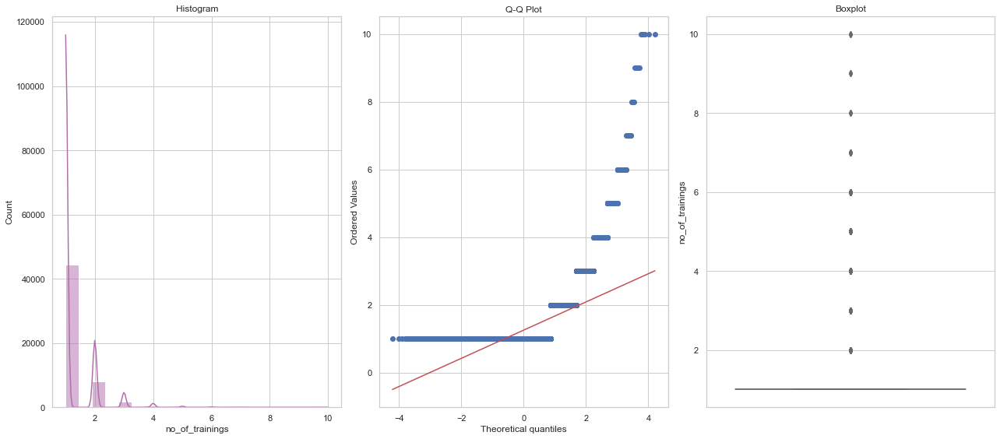

In [22]:
diagnostic_plots(hr_data,'no_of_trainings')

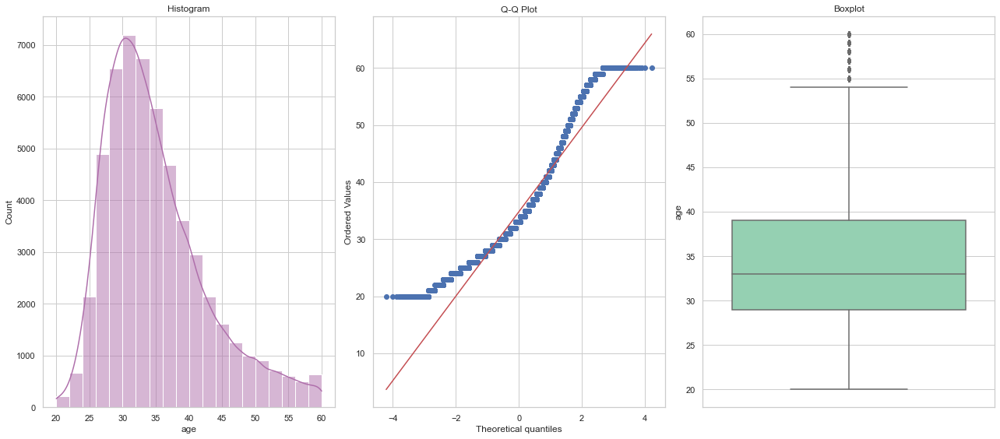

In [23]:
diagnostic_plots(hr_data,'age')

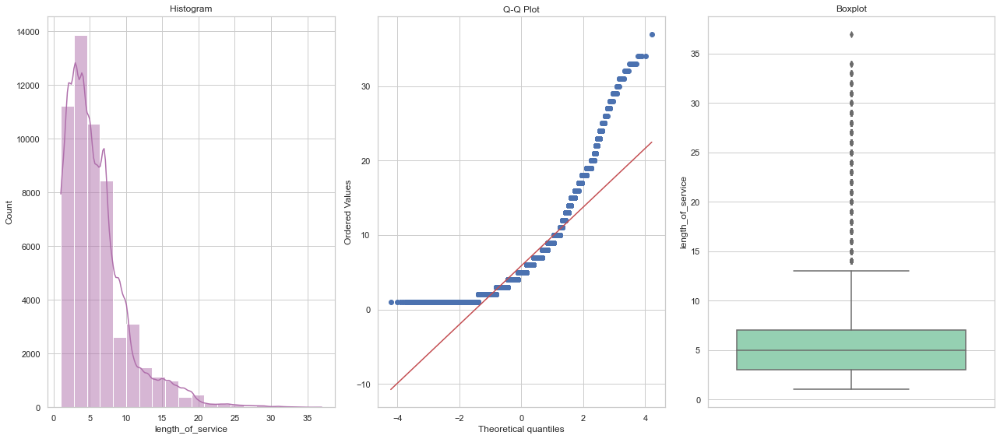

In [24]:
diagnostic_plots(hr_data,'length_of_service')

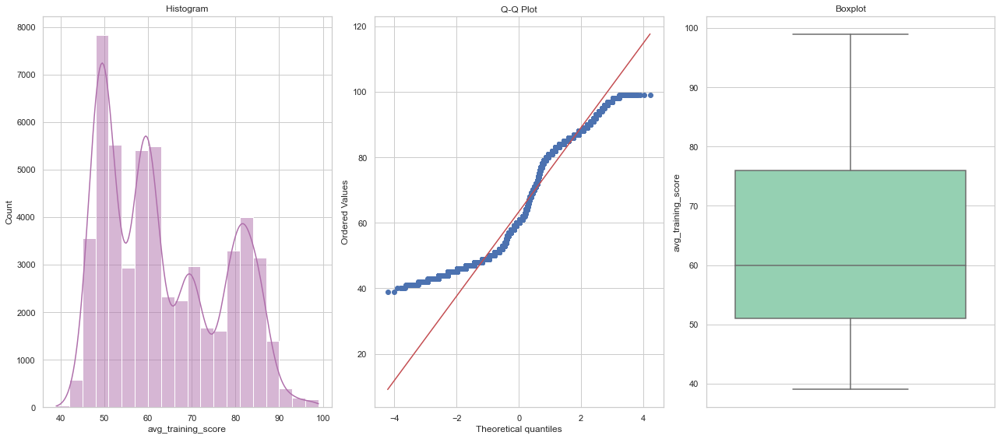

In [25]:
diagnostic_plots(hr_data,'avg_training_score')

In [26]:
# Discrete value

Discrete data: Data that can only take certain values

In [27]:
hr_data[['previous_year_rating','KPIs_met >80%','awards_won?']].describe()

,previous_year_rating,KPIs_met >80%,awards_won?
count,50684.000000,54808.000000,54808.000000
mean,3.329256,0.351974,0.023172
std,1.259993,0.477590,0.150450
min,1.000000,0.000000,0.000000
25%,3.000000,0.000000,0.000000
50%,3.000000,0.000000,0.000000
75%,4.000000,1.000000,0.000000
max,5.000000,1.000000,1.000000


In [28]:
# Calculate Range
range_previous_year_rating = np.max(hr_data['previous_year_rating']) - np.min(hr_data['previous_year_rating'])
range_kpi_met = np.max(hr_data['KPIs_met >80%']) - np.min(hr_data['KPIs_met >80%'])
range_awards_won = np.max(hr_data['awards_won?']) - np.min(hr_data['awards_won?'])

print(f"Range Previous Year Rating: {range_previous_year_rating}")
print(f"Range KPIs Met >80%: {range_kpi_met}")
print(f"Range Awards Won: {range_awards_won}")

# Calculate variance
variance_previous_year_rating = np.var(hr_data['previous_year_rating'])
variance_kpi_met = np.var(hr_data['KPIs_met >80%'])
variance_awards_won = np.var(hr_data['awards_won?'])

print(f"\nVariance Previous Year Rating: {variance_previous_year_rating}")
print(f"Variance KPIs Met >80%: {variance_kpi_met}")
print(f"Variance Awards Won: {variance_awards_won}")


Range Previous Year Rating: 4.0
Range KPIs Met >80%: 1
Range Awards Won: 1

Variance Previous Year Rating: 1.5875499078218258
Variance KPIs Met >80%: 0.2280883519817653
Variance Awards Won: 0.02263486743417964


In [29]:
# Data Visualisations

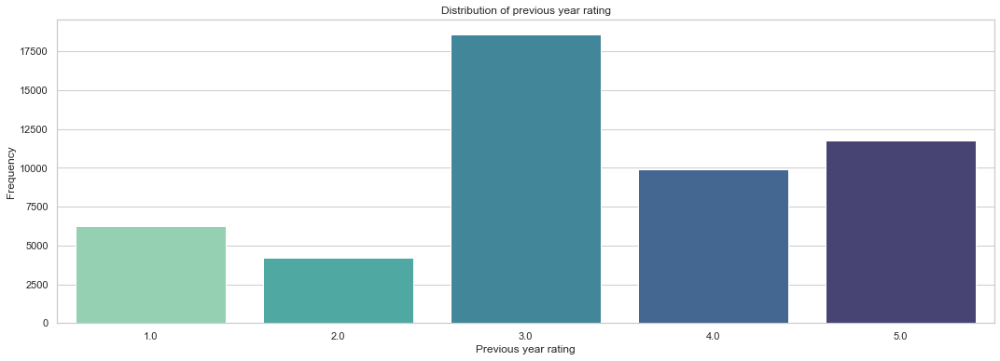

In [30]:
# Plotting the countplot with the HUSL palette
plt.figure(figsize=(18, 6))
sns.countplot(data=hr_data, x='previous_year_rating', palette=sns.color_palette("mako")[::-1])

# Adding labels and title
plt.xlabel('Previous year rating')
plt.ylabel('Frequency')
plt.title('Distribution of previous year rating')

# Display the plot
plt.show()

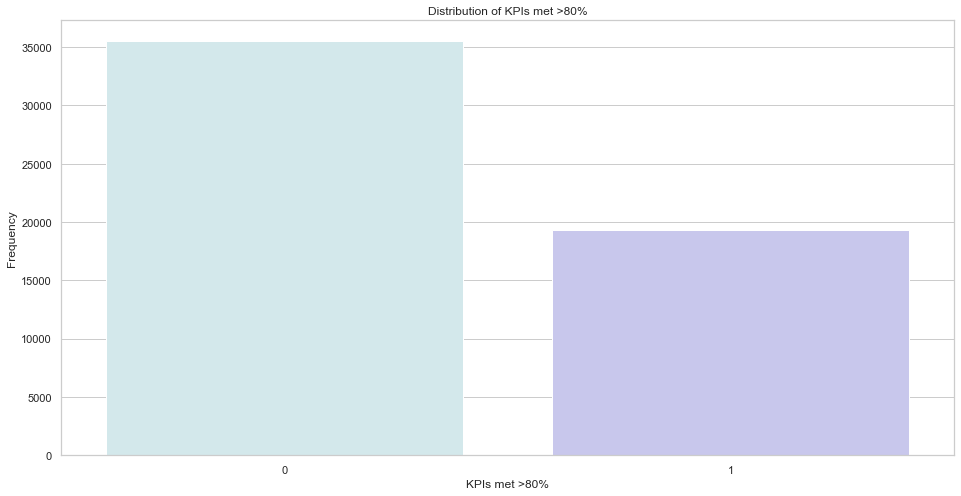

In [31]:
plt.figure(figsize=(16, 8))
sns.countplot(data=hr_data, x='KPIs_met >80%', palette=palette)
plt.xlabel('KPIs met >80%')
plt.ylabel('Frequency')
plt.title('Distribution of KPIs met >80%')
plt.show()

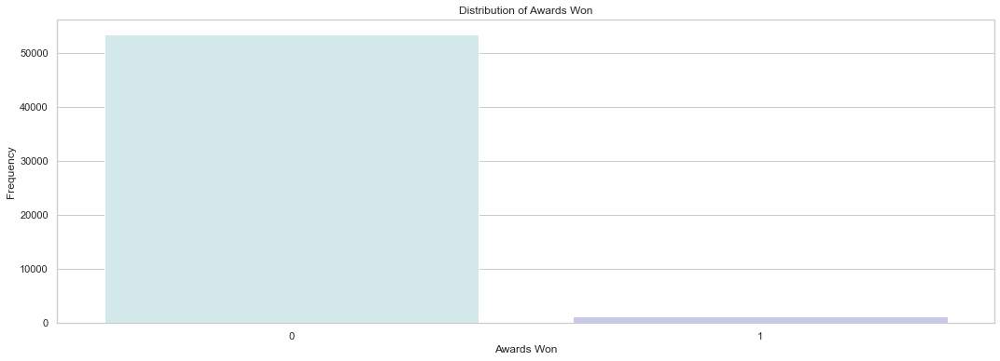

In [32]:
plt.figure(figsize=(18, 6))
sns.countplot(data=hr_data, x='awards_won?', palette=palette)
plt.xlabel('Awards Won')
plt.ylabel('Frequency')
plt.title('Distribution of Awards Won')
plt.show()

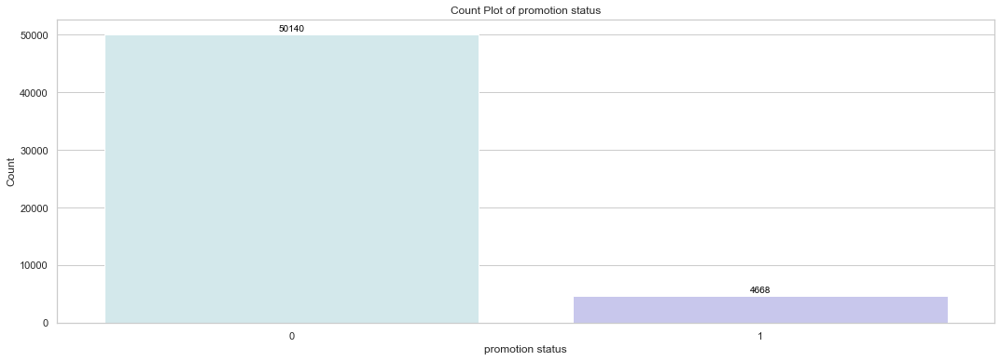

In [33]:
# Create a count plot with slanted x-axis labels
plt.figure(figsize=(18, 6))
ax = sns.countplot(data=hr_data, x='is_promoted', palette=palette)

for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='top', xytext=(0, 10), textcoords='offset points', fontsize=10, color='black')

# Add title and labels
plt.title('Count Plot of promotion status')
plt.xlabel('promotion status')
plt.ylabel('Count')

# Show the plot
plt.show()

In [34]:
is_promoted_percentage = (hr_data['is_promoted'].value_counts()/ len(hr_data)) * 100

print('percentage of employees not promoted: {:.2f}%'.format(is_promoted_percentage[0]))
print('percentage of employees promoted: {:.2f}%'.format(is_promoted_percentage[1]))

percentage of employees not promoted: 91.48%
percentage of employees promoted: 8.52%


In [35]:
# Stratified Sampling

In [36]:
not_promoted = hr_data[hr_data['is_promoted']==0]
is_promoted = hr_data[hr_data['is_promoted']==1]

In [37]:
sampled_hr_data = not_promoted.sample(n=len(is_promoted),random_state=2).copy()
sampled_hr_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4668 entries, 6725 to 12976
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           4668 non-null   int64  
 1   department            4668 non-null   object 
 2   region                4668 non-null   object 
 3   education             4438 non-null   object 
 4   gender                4668 non-null   object 
 5   recruitment_channel   4668 non-null   object 
 6   no_of_trainings       4668 non-null   int64  
 7   age                   4668 non-null   int64  
 8   previous_year_rating  4305 non-null   float64
 9   length_of_service     4668 non-null   int64  
 10  KPIs_met >80%         4668 non-null   int64  
 11  awards_won?           4668 non-null   int64  
 12  avg_training_score    4668 non-null   int64  
 13  is_promoted           4668 non-null   int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 547.0+ KB


In [38]:
new_hr_data = pd.concat([is_promoted,sampled_hr_data],axis=0)

In [39]:
is_promoted_percentage = (new_hr_data['is_promoted'].value_counts()/ len(new_hr_data)) * 100

print('percentage of employees not promoted: {:.2f}%'.format(is_promoted_percentage[0]))
print('percentage of employees promoted: {:.2f}%'.format(is_promoted_percentage[1]))

percentage of employees not promoted: 50.00%
percentage of employees promoted: 50.00%


In [40]:
new_hr_data.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
11,49017,Sales & Marketing,region_7,Bachelor's,f,sourcing,1,35,5.0,3,1,0,50,1
39,58304,Sales & Marketing,region_28,Bachelor's,m,sourcing,1,33,5.0,6,1,0,51,1
60,17673,Sales & Marketing,region_4,Master's & above,m,other,1,50,4.0,17,1,0,47,1
66,77981,Finance,region_22,Bachelor's,m,other,1,27,NaN,1,1,1,58,1
67,16502,Sales & Marketing,region_22,Bachelor's,m,sourcing,1,27,NaN,1,0,0,61,1


In [41]:
new_hr_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9336 entries, 11 to 12976
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           9336 non-null   int64  
 1   department            9336 non-null   object 
 2   region                9336 non-null   object 
 3   education             8984 non-null   object 
 4   gender                9336 non-null   object 
 5   recruitment_channel   9336 non-null   object 
 6   no_of_trainings       9336 non-null   int64  
 7   age                   9336 non-null   int64  
 8   previous_year_rating  8634 non-null   float64
 9   length_of_service     9336 non-null   int64  
 10  KPIs_met >80%         9336 non-null   int64  
 11  awards_won?           9336 non-null   int64  
 12  avg_training_score    9336 non-null   int64  
 13  is_promoted           9336 non-null   int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 1.1+ MB


### 1.2 Cleanse and Transform the data  <a id="part1.2"></a>

In [42]:
# Dealing with missing data

In [43]:
hr_data.isnull().sum()

employee_id                0
department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    4124
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
is_promoted                0
dtype: int64

In [44]:
new_hr_data['education'].fillna(hr_data['education'].mode()[0], inplace=True)

In [45]:
missing_values = new_hr_data[new_hr_data['previous_year_rating'].isnull()]
missing_values

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
66,77981,Finance,region_22,Bachelor's,m,other,1,27,NaN,1,1,1,58,1
67,16502,Sales & Marketing,region_22,Bachelor's,m,sourcing,1,27,NaN,1,0,0,61,1
84,44575,Legal,region_7,Bachelor's,m,other,1,29,NaN,1,0,0,65,1
542,63667,Procurement,region_26,Bachelor's,m,other,1,28,NaN,1,0,0,82,1
566,5272,Operations,region_2,Below Secondary,f,sourcing,1,24,NaN,1,0,0,73,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47574,28305,Technology,region_6,Bachelor's,m,sourcing,1,24,NaN,1,1,0,75,0
43158,59900,Procurement,region_2,Bachelor's,f,sourcing,1,28,NaN,1,0,0,66,0
50973,10256,Operations,region_30,Bachelor's,f,sourcing,1,26,NaN,1,0,0,63,0
24762,45925,Analytics,region_24,Bachelor's,m,other,1,24,NaN,1,0,0,86,0


In [46]:
new_hr_data['previous_year_rating'].fillna(0, inplace=True)

In [47]:
new_hr_data.isnull().sum()

employee_id             0
department              0
region                  0
education               0
gender                  0
recruitment_channel     0
no_of_trainings         0
age                     0
previous_year_rating    0
length_of_service       0
KPIs_met >80%           0
awards_won?             0
avg_training_score      0
is_promoted             0
dtype: int64

In [48]:
# Outlier handling

In [49]:
windsorizer = Winsorizer(capping_method='gaussian', 
                          tail='both',
                          fold=3,
                          variables=['age','no_of_trainings','length_of_service'])

windsorizer.fit(new_hr_data)

Winsorizer(tail='both',
           variables=['age', 'no_of_trainings', 'length_of_service'])

In [50]:
new_hr_data = windsorizer.transform(new_hr_data)

In [51]:
# chi-square test

In [52]:
categorical_columns = new_hr_data.columns[new_hr_data.dtypes == 'object'].tolist()

# Perform chi-square tests for all categorical columns
results = {}
for category in categorical_columns:
    contingency_table = pd.crosstab(new_hr_data[category], new_hr_data['is_promoted'])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    
    results[category] = {
        'Chi-Square Value': chi2,
        'P-value': p,
        'Degrees of Freedom': dof,
        'Expected Frequencies': expected
    }

# Display the results
for category, result in results.items():
    print(f"\nChi-Square Test for {category} vs. is_promoted:")
    print(f"Chi-Square Value: {result['Chi-Square Value']}")
    print(f"P-value: {result['P-value']}")
    print(f"Degrees of Freedom: {result['Degrees of Freedom']}")
    print("Expected Frequencies:")
    print(result['Expected Frequencies'])


Chi-Square Test for department vs. is_promoted:
Chi-Square Value: 75.50435548275337
P-value: 3.908915069872812e-13
Degrees of Freedom: 8
Expected Frequencies:
[[ 497.5  497.5]
 [ 210.5  210.5]
 [ 173.   173. ]
 [  72.    72. ]
 [1000.5 1000.5]
 [ 652.   652. ]
 [  80.    80. ]
 [1309.  1309. ]
 [ 673.5  673.5]]

Chi-Square Test for region vs. is_promoted:
Chi-Square Value: 270.0234173095364
P-value: 5.2874771840961654e-39
Degrees of Freedom: 33
Expected Frequencies:
[[5.200e+01 5.200e+01]
 [5.800e+01 5.800e+01]
 [9.800e+01 9.800e+01]
 [4.050e+01 4.050e+01]
 [2.345e+02 2.345e+02]
 [6.500e+01 6.500e+01]
 [2.345e+02 2.345e+02]
 [1.215e+02 1.215e+02]
 [9.100e+01 9.100e+01]
 [1.000e+00 1.000e+00]
 [6.350e+01 6.350e+01]
 [1.013e+03 1.013e+03]
 [6.250e+01 6.250e+01]
 [2.500e+01 2.500e+01]
 [6.285e+02 6.285e+02]
 [1.085e+02 1.085e+02]
 [3.100e+01 3.100e+01]
 [8.600e+01 8.600e+01]
 [1.670e+02 1.670e+02]
 [1.435e+02 1.435e+02]
 [1.345e+02 1.345e+02]
 [6.400e+01 6.400e+01]
 [3.150e+01 3.150e+01]

Here's an explanation for each Chi-Square Test result:

Department vs. is_promoted:

Chi-Square Value: 75.50

P-value: 3.91e-13

Degrees of Freedom: 8

Expected Frequencies: The expected counts for each cell in the contingency table. The test indicates a significant association between the department and the promotion status. The low p-value suggests that the association is not due to chance.

Region vs. is_promoted:

Chi-Square Value: 270.02

P-value: 5.29e-39

Degrees of Freedom: 33

Expected Frequencies: Similar to the previous test, this result indicates a significant association between the region and the promotion status. The p-value is very low, suggesting that the association is not random.

Education vs. is_promoted:

Chi-Square Value: 24.87

P-value: 3.98e-06

Degrees of Freedom: 2

Expected Frequencies: Indicates a significant association between education and promotion status. The p-value is low, suggesting that the association is not likely due to chance.

Gender vs. is_promoted:

Chi-Square Value: 4.19

P-value: 0.04

Degrees of Freedom: 1

Expected Frequencies: Indicates a significant association between gender and promotion status, but with a slightly higher p-value. The association is still statistically significant, but less strongly than in other cases.

Recruitment Channel vs. is_promoted:

Chi-Square Value: 7.11

P-value: 0.03

Degrees of Freedom: 2

Expected Frequencies: Indicates a significant association between the recruitment channel and promotion status. The p-value is low, suggesting that the association is not likely due to chance.

In summary, all the Chi-Square Tests show significant associations between the categorical variables and the promotion status, except for gender, which has a slightly higher p-value but still indicates a significant association. The low p-values suggest that the observed associations are not random and are statistically significant.


In [53]:
# Encoding

In [54]:
ohe_enc = OneHotEncoder(
    
    # to indicate how many top categories
    #top_categories=5,  
    
    # we can select which variables to encode
    variables=['recruitment_channel'],
    
    # to indicate if we drop one of the binaries
    drop_last=False)

ohe_enc.fit(new_hr_data)

OneHotEncoder(variables=['recruitment_channel'])

In [55]:
new_hr_data = ohe_enc.transform(new_hr_data)

In [56]:
top5_ohe_enc = OneHotEncoder(
    
    # to indicate how many top categories
    top_categories=5,  
    
    # we can select which variables to encode
    variables=['department'],
    
    # to indicate if we drop one of the binaries
    drop_last=False)

top5_ohe_enc.fit(new_hr_data)

OneHotEncoder(top_categories=5, variables=['department'])

In [57]:
new_hr_data = top5_ohe_enc.transform(new_hr_data)

In [58]:
label_encoder = LabelEncoder()

In [59]:
new_hr_data[['gender']] = new_hr_data[['gender']].apply(label_encoder.fit_transform)

In [60]:
education_mapping = {"Below Secondary": 1, "Bachelor's": 2, "Master's & above": 3}

# Apply label encoding to the 'education' column
new_hr_data['education'] = new_hr_data['education'].map(education_mapping)

In [61]:
region_mapping = {}

# Iterate through unique values in the 'Category' column and assign an encoded value
for idx, region in enumerate(new_hr_data['region'].unique()):
    region_mapping[region] = idx

print(region_mapping)
# Map the values in the 'Category' column to the encoded values
new_hr_data['region'] = new_hr_data['region'].map(region_mapping)

{'region_7': 0, 'region_28': 1, 'region_4': 2, 'region_22': 3, 'region_31': 4, 'region_2': 5, 'region_11': 6, 'region_15': 7, 'region_13': 8, 'region_23': 9, 'region_25': 10, 'region_34': 11, 'region_5': 12, 'region_17': 13, 'region_20': 14, 'region_12': 15, 'region_26': 16, 'region_1': 17, 'region_14': 18, 'region_29': 19, 'region_32': 20, 'region_3': 21, 'region_16': 22, 'region_6': 23, 'region_27': 24, 'region_21': 25, 'region_8': 26, 'region_19': 27, 'region_10': 28, 'region_33': 29, 'region_30': 30, 'region_24': 31, 'region_18': 32, 'region_9': 33}


In [62]:
# scaling

In [63]:
copy = new_hr_data

In [64]:
from sklearn.preprocessing import MinMaxScaler

# Create a scaler
scaler = MinMaxScaler()
columns_to_scale = ['age', 'length_of_service', 'avg_training_score']
# Fit the scaler to the entire hrdf_new


# Transform the entire hrdf_new
new_hr_data[columns_to_scale] = scaler.fit_transform(new_hr_data[columns_to_scale])
new_hr_data = pd.DataFrame(new_hr_data, columns=copy.columns)

In [65]:
new_hr_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9336 entries, 11 to 12976
Data columns (total 20 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   employee_id                   9336 non-null   int64  
 1   region                        9336 non-null   int64  
 2   education                     9336 non-null   int64  
 3   gender                        9336 non-null   int32  
 4   no_of_trainings               9336 non-null   float64
 5   age                           9336 non-null   float64
 6   previous_year_rating          9336 non-null   float64
 7   length_of_service             9336 non-null   float64
 8   KPIs_met >80%                 9336 non-null   int64  
 9   awards_won?                   9336 non-null   int64  
 10  avg_training_score            9336 non-null   float64
 11  is_promoted                   9336 non-null   int64  
 12  recruitment_channel_sourcing  9336 non-null   int32  
 13  r

In [66]:
new_hr_data.head()

,employee_id,region,education,gender,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted,recruitment_channel_sourcing,recruitment_channel_other,recruitment_channel_referred,department_Sales & Marketing,department_Operations,department_Technology,department_Procurement,department_Analytics
11,49017,0,2,0,1.0,0.406006,5.0,0.11630,1,0,0.155172,1,1,0,0,1,0,0,0,0
39,58304,1,2,1,1.0,0.351872,5.0,0.29075,1,0,0.172414,1,1,0,0,1,0,0,0,0
60,17673,2,3,1,1.0,0.812012,4.0,0.93040,1,0,0.103448,1,0,1,0,1,0,0,0,0
66,77981,3,2,1,1.0,0.189469,0.0,0.00000,1,1,0.293103,1,0,1,0,0,0,0,0,0
67,16502,3,2,1,1.0,0.189469,0.0,0.00000,0,0,0.344828,1,1,0,0,1,0,0,0,0


### 1.3 Correlation Analysis <a id="part1.3"></a>

In [67]:
# new features

In [68]:
new_hr_data['KPIs_met_and_awards_won'] = np.where((new_hr_data['KPIs_met >80%'] == 1) & (new_hr_data['awards_won?'] == 1), 1, 0)

new_hr_data['high_performer'] = np.where(
    (new_hr_data['KPIs_met >80%'] == 1) &
    (new_hr_data['previous_year_rating'] >= 5.0),1,0)

new_hr_data['department_correlation'] = (
    (new_hr_data['department_Technology'] == 1) * 0.41 +
    (new_hr_data['department_Analytics'] == 1) * 0.43 +
    (new_hr_data['department_Sales & Marketing'] == 1) * -0.55 +
    (new_hr_data['department_Procurement'] == 1) * 0.16 +
    (new_hr_data['department_Operations'] == 1) * -0.13
)

new_hr_data['rating_predictor'] = new_hr_data['KPIs_met >80%'] + new_hr_data['length_of_service'] + new_hr_data['age'] + new_hr_data['education']

new_hr_data['performance_indicator'] = new_hr_data['rating_predictor'] + new_hr_data['department_correlation'] + new_hr_data['avg_training_score']

new_hr_data['likely_candidate']=(new_hr_data['KPIs_met >80%']*0.38)+(new_hr_data['avg_training_score']*0.29)+(new_hr_data['previous_year_rating']*0.23)+(new_hr_data['awards_won?']*0.21)


In [69]:
new_hr_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9336 entries, 11 to 12976
Data columns (total 26 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   employee_id                   9336 non-null   int64  
 1   region                        9336 non-null   int64  
 2   education                     9336 non-null   int64  
 3   gender                        9336 non-null   int32  
 4   no_of_trainings               9336 non-null   float64
 5   age                           9336 non-null   float64
 6   previous_year_rating          9336 non-null   float64
 7   length_of_service             9336 non-null   float64
 8   KPIs_met >80%                 9336 non-null   int64  
 9   awards_won?                   9336 non-null   int64  
 10  avg_training_score            9336 non-null   float64
 11  is_promoted                   9336 non-null   int64  
 12  recruitment_channel_sourcing  9336 non-null   int32  
 13  r

In [70]:
# statistical analysis

In [71]:
numerical_columns = new_hr_data.columns[(new_hr_data.dtypes != 'object') & (new_hr_data.columns != 'is_promoted')].tolist()

# Perform point-biserial correlation tests for all numerical columns
results = {}
for numerical_column in numerical_columns:
    correlation, p_value = pointbiserialr(new_hr_data[numerical_column], new_hr_data['is_promoted'])
    
    results[numerical_column] = {
        'Correlation': correlation,
        'P-value': p_value
    }

# Display the results
for numerical_column, result in results.items():
    print(f"\nPoint-Biserial Correlation for {numerical_column} vs. is_promoted:")
    print(f"Correlation: {result['Correlation']}") # (-1 to 1) A positive value indicates a positive relationship (as one variable increases, the other tends to increase). A negative value indicates a negative relationship (as one variable increases, the other tends to decrease).
    print(f"P-value: {result['P-value']}") # A small p-value (typically less than 0.05) indicates that you can reject the null hypothesis and conclude that there is a significant correlation.


Point-Biserial Correlation for employee_id vs. is_promoted:
Correlation: 0.01833509679577223
P-value: 0.07647703569871354

Point-Biserial Correlation for region vs. is_promoted:
Correlation: -0.1004711950639599
P-value: 2.220529910351905e-22

Point-Biserial Correlation for education vs. is_promoted:
Correlation: 0.049829359161300615
P-value: 1.4572630741782707e-06

Point-Biserial Correlation for gender vs. is_promoted:
Correlation: -0.021415077400457828
P-value: 0.03853212844080566

Point-Biserial Correlation for no_of_trainings vs. is_promoted:
Correlation: -0.03881972904028787
P-value: 0.00017557671104289035

Point-Biserial Correlation for age vs. is_promoted:
Correlation: -0.03014215616075299
P-value: 0.003583224413496226

Point-Biserial Correlation for previous_year_rating vs. is_promoted:
Correlation: 0.22717215151875902
P-value: 1.4583853921042325e-109

Point-Biserial Correlation for length_of_service vs. is_promoted:
Correlation: -0.007972470821490612
P-value: 0.441161708550174

Correlation Coefficient: The correlation coefficient ranges from -1 to 1.

A value of 1 indicates a perfect positive correlation.
A value of -1 indicates a perfect negative correlation.
A value of 0 indicates no linear correlation.

P-Value: The p-value associated with the correlation coefficient tells you whether the observed correlation is statistically significant or if it could have occurred by chance. A low p-value (typically below a chosen significance level, e.g., 0.05) suggests that the correlation is unlikely to be a chance occurrence.


In [72]:
# Identify the numerical columns (excluding the 'is_promoted' column)
numerical_columns = new_hr_data.columns[(new_hr_data.dtypes != 'object') & (new_hr_data.columns != 'is_promoted')].tolist()

# Perform t-test for each numerical column
results = {}
for numerical_column in numerical_columns:
    promoted_group = new_hr_data[new_hr_data['is_promoted'] == 1][numerical_column]
    not_promoted_group = new_hr_data[new_hr_data['is_promoted'] == 0][numerical_column]
    
    t_statistic, p_value = ttest_ind(promoted_group, not_promoted_group)
    
    results[numerical_column] = {
        'T-statistic': t_statistic,
        'P-value': p_value
    }

# Display the results
for numerical_column, result in results.items():
    print(f"\nT-test for {numerical_column} between promoted and not promoted employees:")
    print(f"T-statistic: {result['T-statistic']}")
    print(f"P-value: {result['P-value']}") #The p-value is the probability of observing a t-statistic as extreme as the one calculated if there were no actual difference between the groups. A small p-value (typically less than 0.05) suggests that you can reject the null hypothesis, indicating that there is a significant difference between the groups.

# Magnitude of T-statistic:

# The magnitude of the t-statistic reflects the size of the difference relative to the variability in the data.
# Larger absolute values of the t-statistic suggest a larger difference between the group means.

# Rule of Thumb:

# Small t-statistic (close to 0): The means of the groups are similar.
# Large t-statistic (far from 0): The means of the groups are different.
# Sign of T-statistic:

# The sign of the t-statistic indicates the direction of the difference:
# Positive: The mean of the first group is higher.
# Negative: The mean of the second group is higher.


T-test for employee_id between promoted and not promoted employees:
T-statistic: 1.771699722896268
P-value: 0.07647703569874303

T-test for region between promoted and not promoted employees:
T-statistic: -9.756152700688009
P-value: 2.2205299103528315e-22

T-test for education between promoted and not promoted employees:
T-statistic: 4.820133199037668
P-value: 1.4572630741779585e-06

T-test for gender between promoted and not promoted employees:
T-statistic: -2.069441501863065
P-value: 0.03853212844083214

T-test for no_of_trainings between promoted and not promoted employees:
T-statistic: -3.7533051910921187
P-value: 0.00017557671104285758

T-test for age between promoted and not promoted employees:
T-statistic: -2.9134367391949745
P-value: 0.0035832244135016213

T-test for previous_year_rating between promoted and not promoted employees:
T-statistic: 22.53693552511547
P-value: 1.4583853921075315e-109

T-test for length_of_service between promoted and not promoted employees:
T-statis

T-Statistic: The t-statistic is used to test the null hypothesis that the true correlation coefficient is zero (no correlation). A higher absolute t-statistic value, combined with a low p-value, indicates that the correlation is statistically significant.
    
P-Value: The p-value associated with the correlation coefficient tells you whether the observed correlation is statistically significant or if it could have occurred by chance. A low p-value (typically below a chosen significance level, e.g., 0.05) suggests that the correlation is unlikely to be a chance occurrence.

In [73]:
X = new_hr_data[['previous_year_rating','KPIs_met >80%','awards_won?','avg_training_score','KPIs_met_and_awards_won','high_performer','rating_predictor','performance_indicator','likely_candidate']]
y = new_hr_data['is_promoted']
X = sm.add_constant(X)
model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:            is_promoted   R-squared:                       0.319
Model:                            OLS   Adj. R-squared:                  0.318
Method:                 Least Squares   F-statistic:                     545.1
Date:                Sat, 09 Dec 2023   Prob (F-statistic):               0.00
Time:                        23:22:57   Log-Likelihood:                -4985.4
No. Observations:                9336   AIC:                             9989.
Df Residuals:                    9327   BIC:                         1.005e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

Key components of the summary:

The linear regression model aims to predict the likelihood of promotion ‘is_promoted’ based on various independent variables. The model exhibits a moderate fit, with an R-squared value of 32.3%, indicating that approximately one-third of the variance in promotions can be explained by the included predictors. The adjusted R-squared accounts for the number of predictors and offers a reliable metric for model comparison. The overall significance of the model is supported by a high F-statistic of 556.6, accompanied by a low p-value. The coefficient table outlines the impact of each independent variable on the dependent variable, with associated p-values indicating statistical significance. The intercept (const) suggests an expected promotion likelihood of approximately -0.3345 when all independent variables are zero. Other statistical tests, such as Omnibus and Durbin-Watson, assess the normality and autocorrelation of residuals. The model's performance is further scrutinized through tests like Jarque-Bera and the condition number. This comprehensive summary provides valuable insights into the predictive capacity of the linear regression model and the significance of individual predictors in determining promotions.


In [74]:
# Correlation visuals

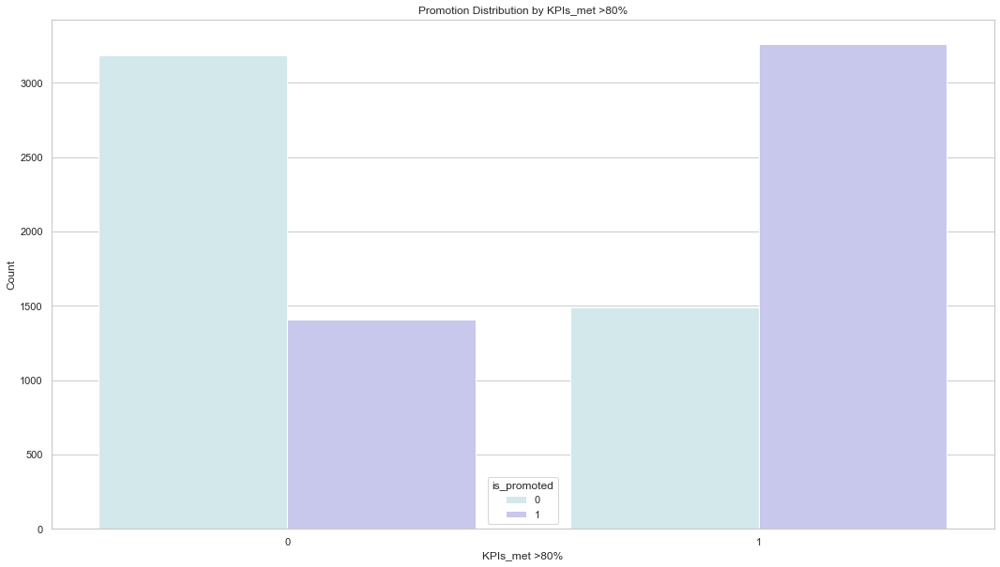

In [75]:
feature = 'KPIs_met >80%'
target_variable = 'is_promoted'

plt.figure(figsize=(18, 10))
sns.countplot(x=feature, hue=target_variable, data=new_hr_data, palette=palette)
plt.xlabel(feature)
plt.ylabel('Count')
plt.title(f'Promotion Distribution by {feature}')
plt.show()

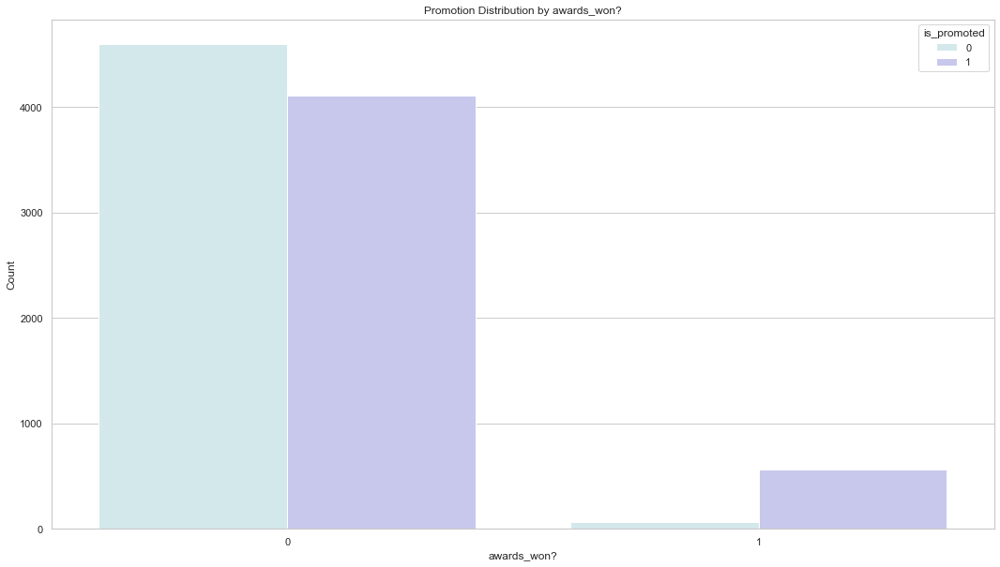

In [76]:
feature = 'awards_won?'
target_variable = 'is_promoted'

plt.figure(figsize=(18, 10))
sns.countplot(x=feature, hue=target_variable, data=new_hr_data, palette=palette)
plt.xlabel(feature)
plt.ylabel('Count')
plt.title(f'Promotion Distribution by {feature}')
plt.show()

<Figure size 1440x1080 with 0 Axes>

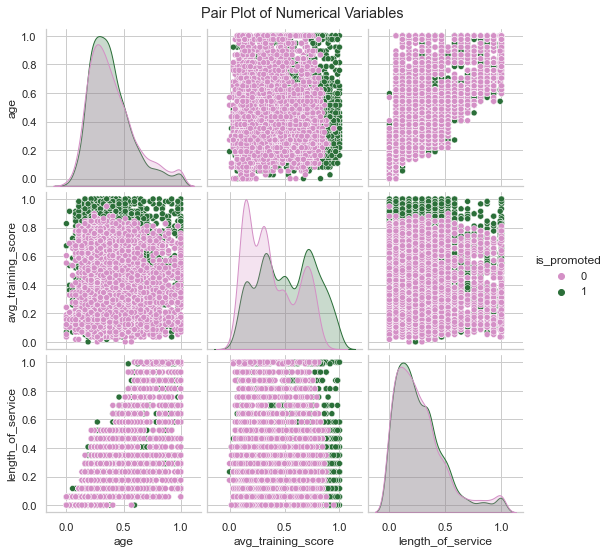

In [77]:
plt.figure(figsize=(20, 15))
sns.pairplot(new_hr_data[['age', 'avg_training_score', 'length_of_service', 'is_promoted']], hue='is_promoted', palette=sns.color_palette("cubehelix", 2)[::-1])
plt.suptitle('Pair Plot of Numerical Variables', y=1.02)
plt.show()


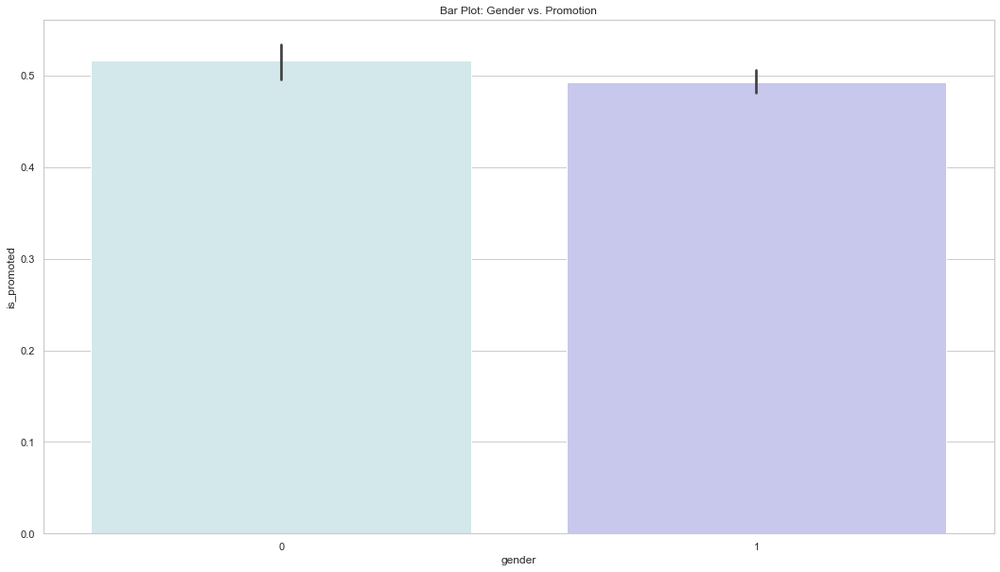

In [78]:
plt.figure(figsize=(18, 10))
sns.barplot(x='gender', y='is_promoted', data=new_hr_data, palette=palette)
plt.title('Bar Plot: Gender vs. Promotion')
plt.show()


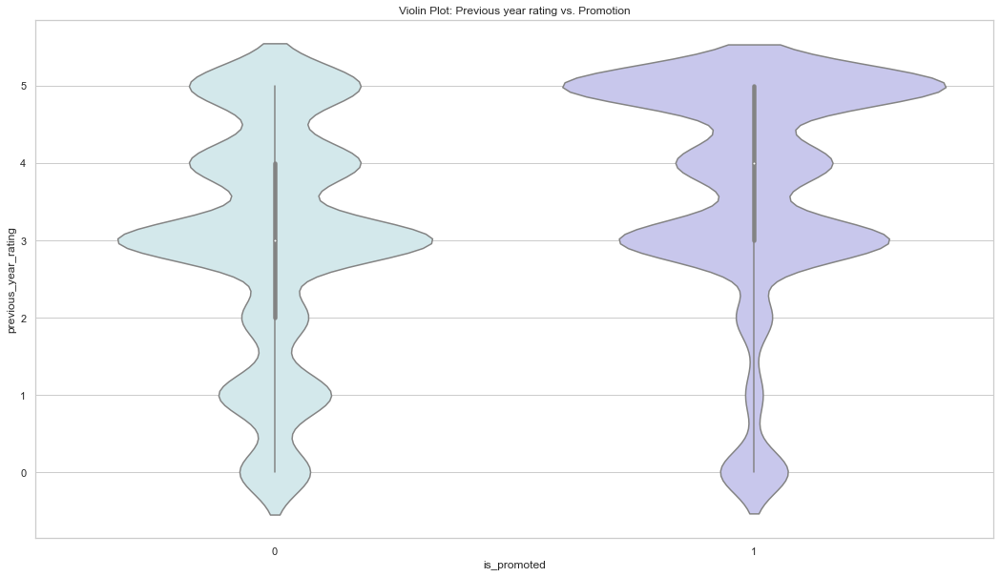

In [79]:
plt.figure(figsize=(18, 10))
sns.violinplot(x='is_promoted', y='previous_year_rating', data=new_hr_data, palette=palette)
plt.title('Violin Plot: Previous year rating vs. Promotion')
plt.show()


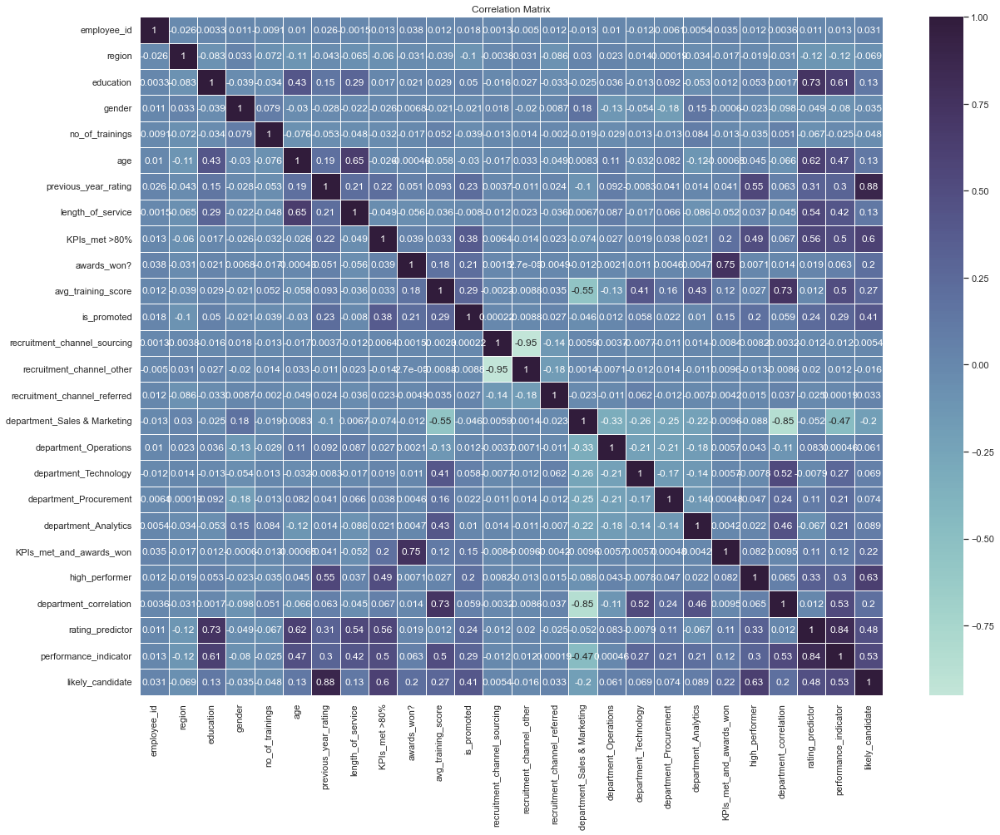

In [80]:
plt.figure(figsize=(20, 15))
sns.heatmap(new_hr_data.corr(), annot=True, cmap=sns.cubehelix_palette(start=.5, rot=-.5, as_cmap=True), linewidths=0.5, linecolor='white')
plt.title('Correlation Matrix')
plt.show()

In [81]:
new_hr_data = new_hr_data.drop(['region', 'recruitment_channel_sourcing', 'recruitment_channel_other','employee_id','education','gender','no_of_trainings','age','length_of_service','recruitment_channel_referred','department_Sales & Marketing','department_Operations','department_Technology','department_Procurement','department_Analytics','department_correlation'], axis=1)

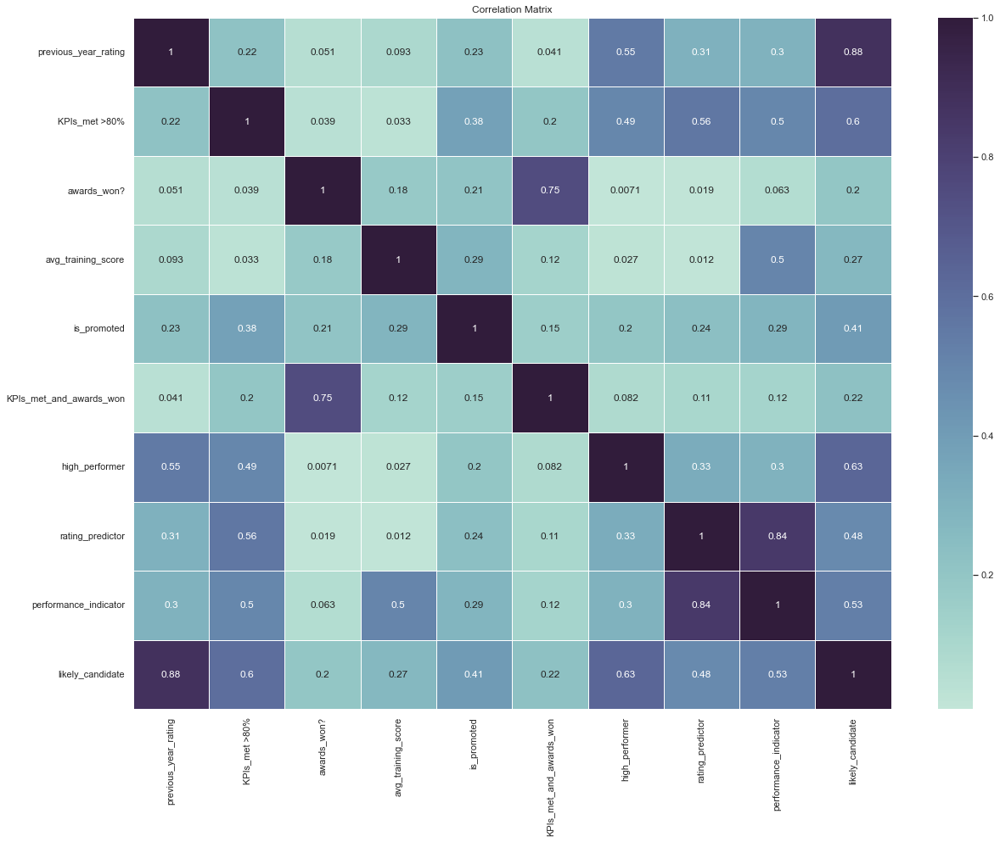

In [82]:
plt.figure(figsize=(20, 15))
sns.heatmap(new_hr_data.corr(), annot=True, cmap=sns.cubehelix_palette(start=.5, rot=-.5, as_cmap=True), linewidths=0.5, linecolor='white')
plt.title('Correlation Matrix')
plt.show()

### 1.4 Export the data <a id="part1.4"></a>

In [83]:
new_hr_data.to_csv("new_hr_data.csv",index=False)

## 2. Airbnb<a id="part2"></a>

### 2.1 Load and Explore the data<a id="part2.1"></a>

In [84]:
listings = pd.read_csv('./listings.csv')

In [85]:
listings.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355


In [86]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              7907 non-null   int64  
 1   name                            7905 non-null   object 
 2   host_id                         7907 non-null   int64  
 3   host_name                       7907 non-null   object 
 4   neighbourhood_group             7907 non-null   object 
 5   neighbourhood                   7907 non-null   object 
 6   latitude                        7907 non-null   float64
 7   longitude                       7907 non-null   float64
 8   room_type                       7907 non-null   object 
 9   price                           7907 non-null   int64  
 10  minimum_nights                  7907 non-null   int64  
 11  number_of_reviews               7907 non-null   int64  
 12  last_review                     51

## Numerical Data Exploration

In [87]:
## Continous Values

In [88]:
# Statistical Approach

In [89]:
listings[['price','reviews_per_month']].describe()

,price,reviews_per_month
count,7907.000000,5149.000000
mean,169.332996,1.043669
std,340.187599,1.285851
min,0.000000,0.010000
25%,65.000000,0.180000
50%,124.000000,0.550000
75%,199.000000,1.370000
max,10000.000000,13.000000


In [90]:
range_price = np.max(listings['price']) - np.min(listings['price'])
range_monthly_reviews = np.max(listings['reviews_per_month']) - np.min(listings['reviews_per_month'])

print(f"Range Prices: {range_price}")
print(f"Range Monthly Reviews: {range_monthly_reviews}")

# Calculate variances
variance_price = np.var(listings['price'])
variance_monthly_reviews = np.var(listings['reviews_per_month'])

print(f"\nVariance Price: {variance_price}")
print(f"Variance Reviews per Month: {variance_monthly_reviews}")

Range Prices: 10000
Range Monthly Reviews: 12.99

Variance Price: 115712.96651338282
Variance Reviews per Month: 1.6530922895236146


In [91]:
# Data Visualisation

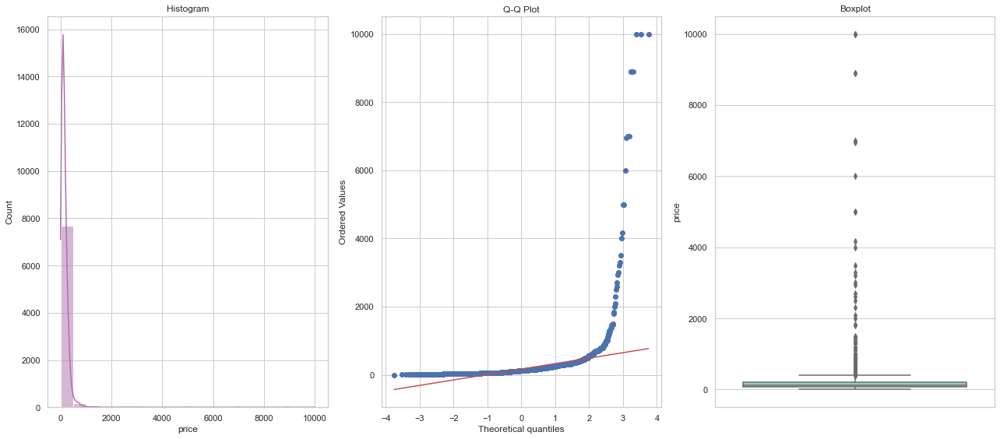

In [92]:
diagnostic_plots(listings,'price')

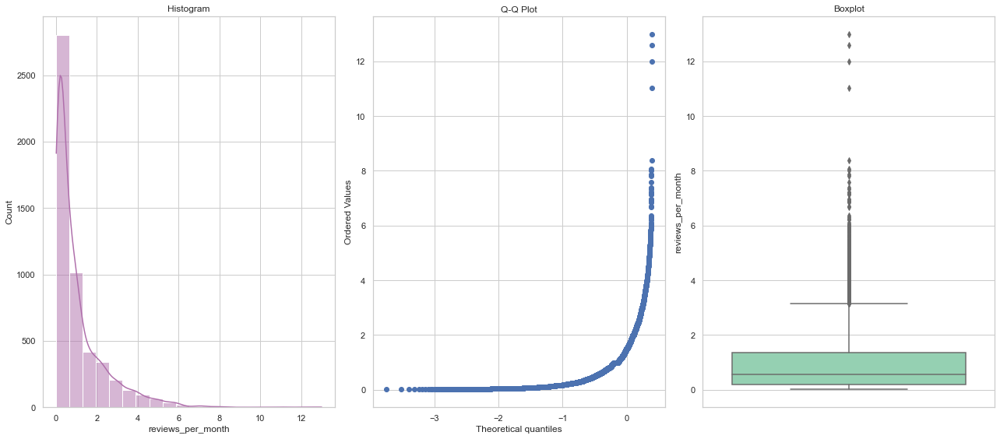

In [93]:
diagnostic_plots(listings,'reviews_per_month')

In [94]:
# Discrete Values

In [95]:
# Statistical Approach

In [96]:
listings[['minimum_nights','number_of_reviews','calculated_host_listings_count','availability_365']].describe()

,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
count,7907.000000,7907.000000,7907.000000,7907.000000
mean,17.510054,12.807386,40.607689,208.726318
std,42.094616,29.707746,65.135253,146.120034
min,1.000000,0.000000,1.000000,0.000000
25%,1.000000,0.000000,2.000000,54.000000
50%,3.000000,2.000000,9.000000,260.000000
75%,10.000000,10.000000,48.000000,355.000000
max,1000.000000,323.000000,274.000000,365.000000


In [97]:
range_minimum_nights = np.max(listings['minimum_nights']) - np.min(listings['minimum_nights'])
range_number_of_reviews = np.max(listings['number_of_reviews']) - np.min(listings['number_of_reviews'])
range_listing_count = np.max(listings['calculated_host_listings_count']) - np.min(listings['calculated_host_listings_count'])
range_availability_365 = np.max(listings['availability_365']) - np.min(listings['availability_365'])

print(f"Range Minimum Nights: {range_minimum_nights}")
print(f"Range No. of Reviews: {range_number_of_reviews}")
print(f"Range Listing Count: {range_listing_count}")
print(f"Range Availability 365: {range_availability_365}")

# Calculate variances
variance_minimum_nights = np.var(listings['minimum_nights'])
variance_number_of_reviews = np.var(listings['number_of_reviews'])
variance_listings_count = np.var(listings['calculated_host_listings_count'])
variance_availability_365 = np.var(listings['availability_365'])

print(f"Variance Minimum Nights: {variance_minimum_nights}")
print(f"Variance No. of Reviews: {variance_number_of_reviews}")
print(f"Variance Calculated Host Listings: {variance_listings_count}")
print(f"Variance Availability 365: {variance_availability_365}")

Range Minimum Nights: 999
Range No. of Reviews: 323
Range Listing Count: 273
Range Availability 365: 365
Variance Minimum Nights: 1771.7326357248542
Variance No. of Reviews: 882.4385542767798
Variance Calculated Host Listings: 4242.064632918368
Variance Availability 365: 21348.364203001423


In [98]:
# Data Visualisations

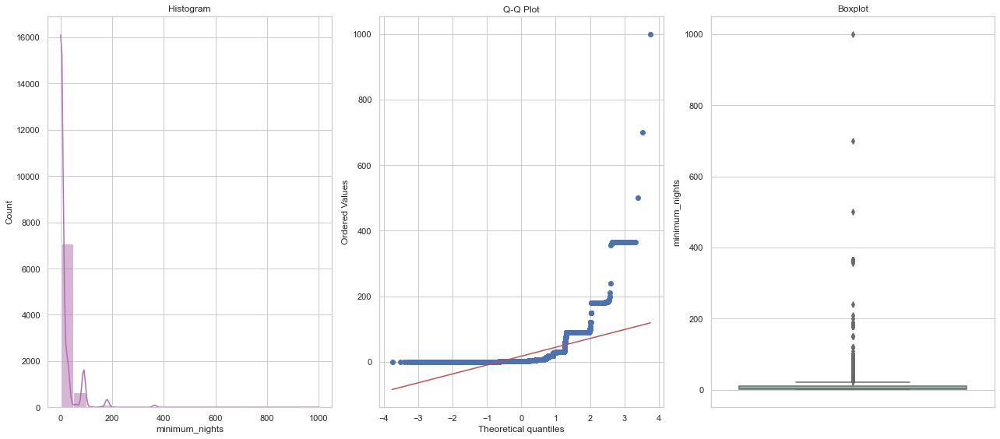

In [99]:
diagnostic_plots(listings,'minimum_nights')

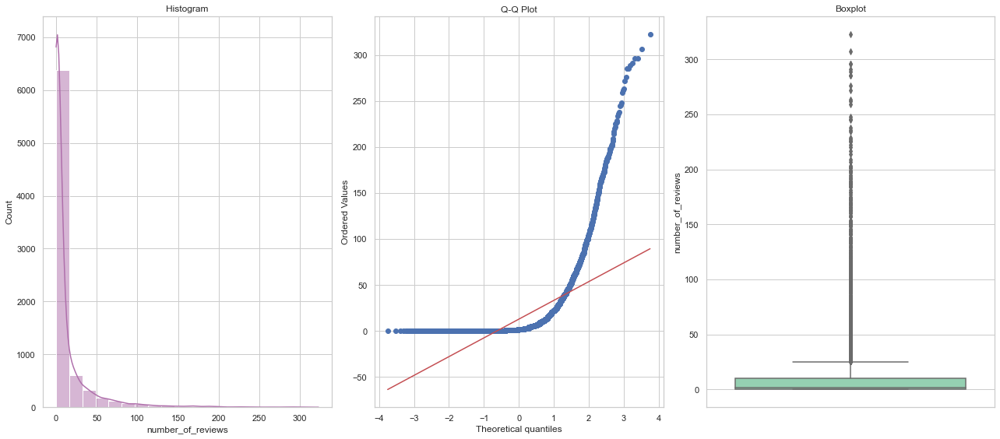

In [100]:
diagnostic_plots(listings,'number_of_reviews')

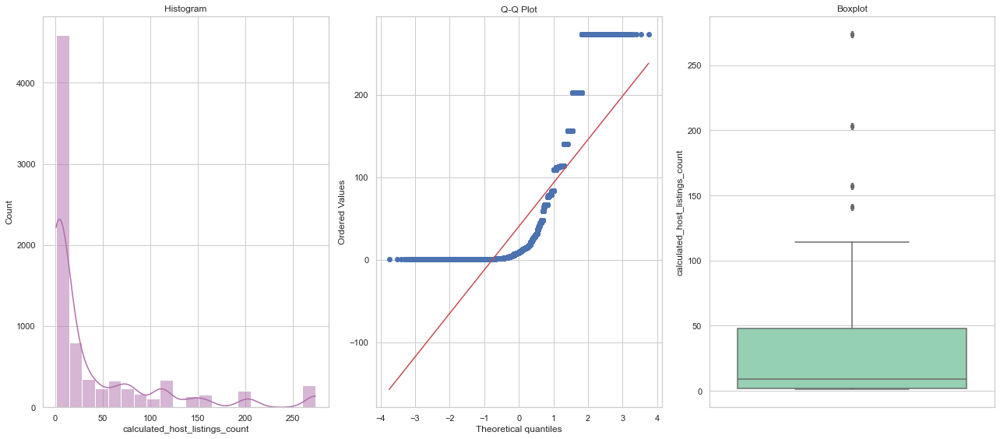

In [101]:
diagnostic_plots(listings,'calculated_host_listings_count')

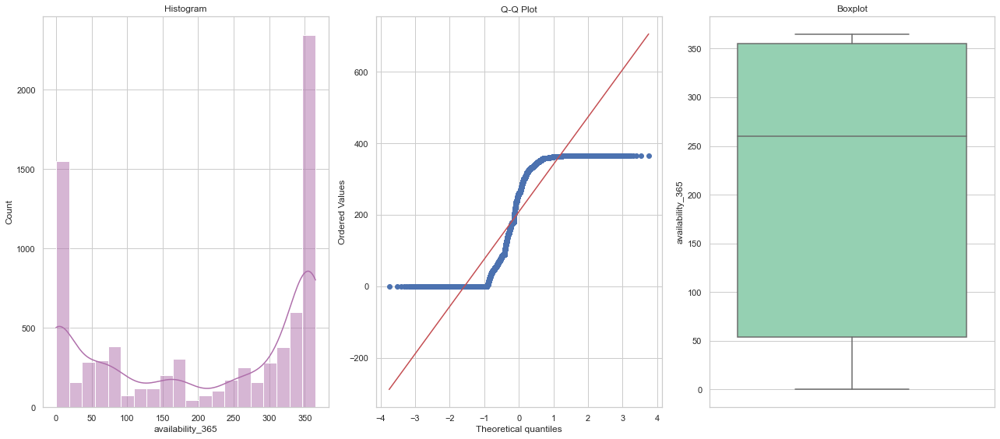

In [102]:
diagnostic_plots(listings,'availability_365')

In [103]:
# Categorical Data Exploration

In [104]:
# Data Visualisation

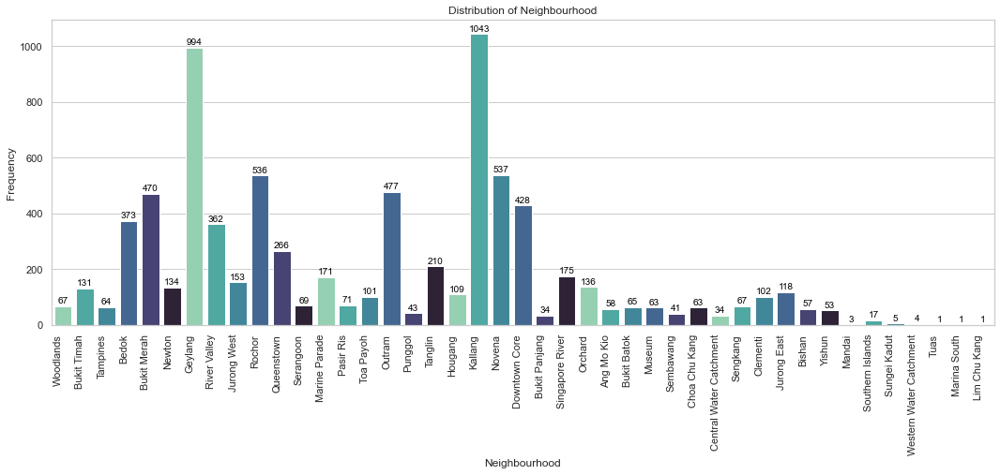

In [105]:
# Plotting the countplot with the HUSL palette
plt.figure(figsize=(18, 6))
ax = sns.countplot(data=listings, x='neighbourhood', palette=sns.color_palette("mako")[::-1])

for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='top', xytext=(0, 10), textcoords='offset points', fontsize=10, color='black')

# Adding labels and title
plt.xlabel('Neighbourhood')
plt.ylabel('Frequency')
plt.title('Distribution of Neighbourhood')

# Rotating x-axis labels
plt.xticks(rotation=90, ha='right')

# Show the plot
plt.show()

Text(0.5, 1.0, 'Distribution of Room Type')

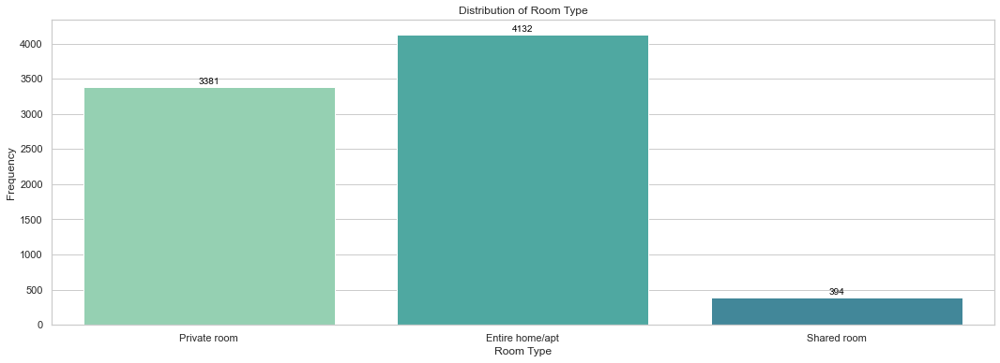

In [106]:
# Plotting the countplot with the HUSL palette
plt.figure(figsize=(18, 6))
ax = sns.countplot(data=listings, x='room_type', palette=sns.color_palette("mako")[::-1])

for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='top', xytext=(0, 10), textcoords='offset points', fontsize=10, color='black')

# Adding labels and title
plt.xlabel('Room Type')
plt.ylabel('Frequency')
plt.title('Distribution of Room Type')

In [107]:
import folium
from folium.plugins import FastMarkerCluster

# Create a Folium map centered at a specific location (mean latitude and longitude)
map_center = [listings['latitude'].mean(), listings['longitude'].mean()]
my_map = folium.Map(location=map_center, zoom_start=4)

# Use FastMarkerCluster for improved performance
marker_cluster = FastMarkerCluster(data=list(zip(listings['latitude'], listings['longitude']))).add_to(my_map)

# Add markers to the cluster for each data point in the DataFrame
for index, row in listings.iterrows():
    popup_text = f"Neighbourhood: {row['neighbourhood']}<br>Count: 1"
    folium.Marker(location=[row['latitude'], row['longitude']], popup=folium.Popup(popup_text, parse_html=True)).add_to(marker_cluster)

# Save the map to an HTML file or display it
my_map.save("map.html")
# or display the map inline
my_map

Text(0.5, 1.0, 'Distribution of Neighbourhood Group')

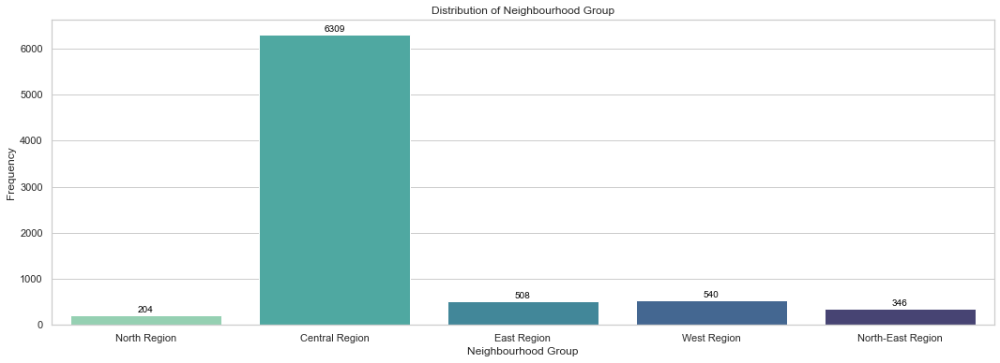

In [108]:
# Plotting the countplot with the HUSL palette
plt.figure(figsize=(18, 6))
ax = sns.countplot(data=listings, x='neighbourhood_group', palette=sns.color_palette("mako")[::-1])

for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='top', xytext=(0, 10), textcoords='offset points', fontsize=10, color='black')

# Adding labels and title
plt.xlabel('Neighbourhood Group')
plt.ylabel('Frequency')
plt.title('Distribution of Neighbourhood Group')

In [109]:
# Subsetting

In [110]:
central_listings = listings.loc[listings['neighbourhood_group'] == 'Central Region', :].copy()

### 2.2 Cleanse and Transform the data <a id="part2.2"></a>

In [111]:
# data standerdization

In [112]:
central_listings['last_review'] = pd.to_datetime(central_listings['last_review'])

In [113]:
central_listings['last_review_year'] = central_listings['last_review'].dt.year
central_listings['last_review_month'] = central_listings['last_review'].dt.month
central_listings['last_review_day'] = central_listings['last_review'].dt.day

In [114]:
# null values

In [115]:
listings.isnull().sum()

id                                   0
name                                 2
host_id                              0
host_name                            0
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       2758
reviews_per_month                 2758
calculated_host_listings_count       0
availability_365                     0
dtype: int64

In [116]:
missing_values = central_listings[central_listings['last_review'].isnull() & central_listings['reviews_per_month'].isnull()]
missing_values

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,last_review_year,last_review_month,last_review_day
18,355955,Double room in an Authentic Peranakan Shophouse,1759905,Aresha,Central Region,Geylang,1.31420,103.90232,Private room,81,90,0,NaT,NaN,1,173,NaN,NaN,NaN
26,642660,BEST CITY LIVING WITH GA RESIDENCE,3212572,Roger,Central Region,Rochor,1.30109,103.85234,Private room,167,180,0,NaT,NaN,1,365,NaN,NaN,NaN
28,719944,HDB housing in prime area near town,3648224,Audrey,Central Region,Queenstown,1.30901,103.79639,Shared room,208,1,0,NaT,NaN,1,0,NaN,NaN,NaN
37,782227,"Cosy, bright, tasefully furnished",4125828,Jenny,Central Region,Queenstown,1.28342,103.78585,Private room,128,3,0,NaT,NaN,1,365,NaN,NaN,NaN
46,880846,1 bedrm Aptm by Farrer Park Mrt,4659563,Gin,Central Region,Kallang,1.31357,103.85731,Private room,100,365,0,NaT,NaN,1,365,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7902,38105126,Loft 2 pax near Haw Par / Pasir Panjang. Free ...,278109833,Belle,Central Region,Queenstown,1.27973,103.78751,Entire home/apt,100,3,0,NaT,NaN,31,61,NaN,NaN,NaN
7903,38108273,3bedroom luxury at Orchard,238891646,Neha,Central Region,Tanglin,1.29269,103.82623,Entire home/apt,550,6,0,NaT,NaN,34,365,NaN,NaN,NaN
7904,38109336,[ Farrer Park ] New City Fringe CBD Mins to MRT,281448565,Mindy,Central Region,Kallang,1.31286,103.85996,Private room,58,30,0,NaT,NaN,3,173,NaN,NaN,NaN
7905,38110493,Cheap Master Room in Central of Singapore,243835202,Huang,Central Region,River Valley,1.29543,103.83801,Private room,56,14,0,NaT,NaN,2,30,NaN,NaN,NaN


In [117]:
central_listings =central_listings.fillna(0)

In [118]:
central_listings.isnull().sum()

id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
last_review_year                  0
last_review_month                 0
last_review_day                   0
dtype: int64

In [119]:
# outlier handling

In [120]:
windsorizer = Winsorizer(capping_method ='quantiles', 
                        tail='both', # cap left, right or both tails
                        fold =0.05,
                        variables=['minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count'])

windsorizer.fit(central_listings)

Winsorizer(capping_method='quantiles', fold=0.05, tail='both',
           variables=['minimum_nights', 'number_of_reviews',
                      'reviews_per_month', 'calculated_host_listings_count'])

In [121]:
listings = windsorizer.transform(central_listings)

In [122]:
# Numerical transformation

In [123]:
yjt = YeoJohnsonTransformer(variables=['minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count'])

yjt.fit(central_listings)

YeoJohnsonTransformer(variables=['minimum_nights', 'number_of_reviews',
                                 'reviews_per_month',
                                 'calculated_host_listings_count'])

In [124]:
central_listings = yjt.transform(central_listings)

In [125]:
disc = EqualWidthDiscretiser(bins=10, variables = ['availability_365'])

disc.fit(central_listings)

EqualWidthDiscretiser(variables=['availability_365'])

In [126]:
disc.binner_dict_

{'availability_365': [-inf,
  36.5,
  73.0,
  109.5,
  146.0,
  182.5,
  219.0,
  255.5,
  292.0,
  328.5,
  inf]}

In [127]:
# Encoding

In [128]:
ohe_enc = OneHotEncoder(
    
    # we can select which variables to encode
    variables=['room_type'],
    
    # to indicate if we drop one of the binaries
    drop_last=False)

ohe_enc.fit(central_listings)

OneHotEncoder(variables=['room_type'])

In [129]:
central_listings = ohe_enc.transform(central_listings)

In [130]:
neighbourhood_mapping = {}

# Iterate through unique values in the 'Category' column and assign an encoded value
for idx, neighbourhood in enumerate(central_listings['neighbourhood'].unique()):
    neighbourhood_mapping[neighbourhood] = idx

print(neighbourhood_mapping)
# Map the values in the 'Category' column to the encoded values
central_listings['neighbourhood'] = central_listings['neighbourhood'].map(neighbourhood_mapping)

{'Bukit Timah': 0, 'Bukit Merah': 1, 'Newton': 2, 'Geylang': 3, 'River Valley': 4, 'Rochor': 5, 'Queenstown': 6, 'Marine Parade': 7, 'Toa Payoh': 8, 'Outram': 9, 'Tanglin': 10, 'Kallang': 11, 'Novena': 12, 'Downtown Core': 13, 'Singapore River': 14, 'Orchard': 15, 'Museum': 16, 'Bishan': 17, 'Southern Islands': 18, 'Marina South': 19}


In [131]:
central_listings.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,price,minimum_nights,...,last_review,reviews_per_month,calculated_host_listings_count,availability_365,last_review_year,last_review_month,last_review_day,room_type_Private room,room_type_Entire home/apt,room_type_Shared room
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,0,1.33235,103.78521,81,1.620342,...,2014-12-26 00:00:00,0.202427,0.680453,365,2014.0,12.0,26.0,1,0,0
10,275343,Conveniently located City Room!( (Phone number...,1439258,K2 Guesthouse,Central Region,1,1.28875,103.80814,44,1.393207,...,2019-04-21 00:00:00,0.175112,3.188950,331,2019.0,4.0,21.0,1,0,0
11,275344,15 mins to Outram MRT Single Room (B),1439258,K2 Guesthouse,Central Region,1,1.28837,103.81099,40,1.506672,...,2018-09-13 00:00:00,0.095798,3.188950,276,2018.0,9.0,13.0,1,0,0
13,294281,5 mins walk from Newton subway,1521514,Elizabeth,Central Region,2,1.31125,103.83816,65,0.816478,...,2019-08-22 00:00:00,0.455853,1.848046,336,2019.0,8.0,22.0,1,0,0
14,324945,20 Mins to Sentosa @ Hilltop ! (8),1439258,K2 Guesthouse,Central Region,1,1.28976,103.80896,44,1.506672,...,2019-02-02 00:00:00,0.124694,3.188950,340,2019.0,2.0,2.0,1,0,0


In [132]:
# clustering

In [133]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3, random_state = 42)
central_listings['location'] = kmeans.fit_predict(central_listings[['latitude', 'longitude']])

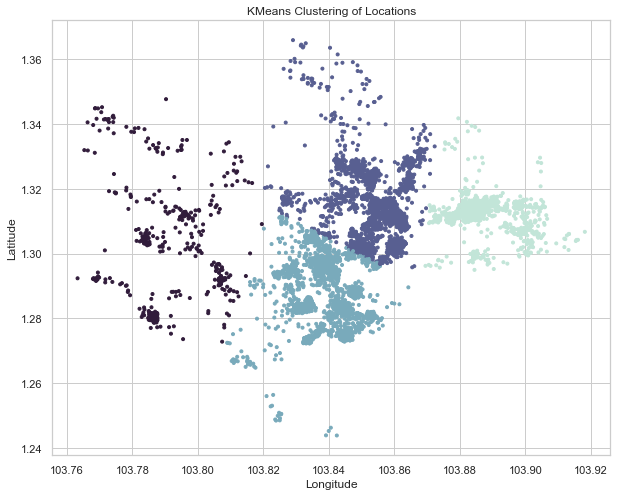

In [134]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Assuming 'latitude' and 'longitude' are columns in your DataFrame
features = central_listings[['latitude', 'longitude']]

# Fit KMeans
kmeans = KMeans(n_clusters=4, random_state=42)
central_listings['location'] = kmeans.fit_predict(features)

# Plotting the clusters
plt.figure(figsize=(10, 8))
plt.scatter(central_listings['longitude'], central_listings['latitude'], c=central_listings['location'], cmap=sns.cubehelix_palette(start=.5, rot=-.5, as_cmap=True), marker='.')
plt.title('KMeans Clustering of Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


In [135]:
# Assuming central_listings is your DataFrame

columns_to_drop = ['name', 'host_name', 'neighbourhood_group','last_review','id']
central_listings = central_listings.drop(columns=columns_to_drop, axis=1)


In [136]:
central_listings.head()

,host_id,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,last_review_year,last_review_month,last_review_day,room_type_Private room,room_type_Entire home/apt,room_type_Shared room,location
1,227796,0,1.33235,103.78521,81,1.620342,1.866558,0.202427,0.680453,365,2014.0,12.0,26.0,1,0,0,3
10,1439258,1,1.28875,103.80814,44,1.393207,1.866558,0.175112,3.188950,331,2019.0,4.0,21.0,1,0,0,3
11,1439258,1,1.28837,103.81099,40,1.506672,1.644258,0.095798,3.188950,276,2018.0,9.0,13.0,1,0,0,3
13,1521514,2,1.31125,103.83816,65,0.816478,2.384556,0.455853,1.848046,336,2019.0,8.0,22.0,1,0,0,2
14,1439258,1,1.28976,103.80896,44,1.506672,1.747415,0.124694,3.188950,340,2019.0,2.0,2.0,1,0,0,3


In [137]:
# scaling

In [138]:
copy = central_listings

In [139]:
from sklearn.preprocessing import StandardScaler

# Define the columns you want to scale
columns_to_scale = central_listings.columns[central_listings.columns != 'price']

# Create a StandardScaler
scaler = StandardScaler()

# Fit and transform only the specified columns
central_listings[columns_to_scale] = scaler.fit_transform(central_listings[columns_to_scale])
central_listings= pd.DataFrame(central_listings, columns=copy.columns)

### 2.3 Correlation Analysis <a id="part2.3"></a>

In [140]:
central_listings.head()

,host_id,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,last_review_year,last_review_month,last_review_day,room_type_Private room,room_type_Entire home/apt,room_type_Shared room,location
1,-1.103693,-1.710009,1.745019,-2.626266,81,1.720867,1.139782,-0.012194,-1.370618,1.041662,0.718033,2.017071,1.523135,1.355749,-1.205781,-0.241618,1.959762
10,-1.089230,-1.485787,-0.904141,-1.710773,44,1.080109,1.139782,-0.147512,0.474925,0.804864,0.723250,-0.108174,1.038675,1.355749,-1.205781,-0.241618,1.959762
11,-1.089230,-1.485787,-0.927230,-1.596985,40,1.400198,0.869294,-0.540434,0.474925,0.421809,0.722207,1.220104,0.263539,1.355749,-1.205781,-0.241618,1.959762
13,-1.088248,-1.261565,0.462971,-0.512207,65,-0.546862,1.770067,1.243285,-0.511600,0.839687,0.723250,0.954449,1.135567,1.355749,-1.205781,-0.241618,0.800986
14,-1.089230,-1.485787,-0.842773,-1.678034,44,1.400198,0.994811,-0.397280,0.474925,0.867546,0.723250,-0.639485,-0.802273,1.355749,-1.205781,-0.241618,1.959762


In [141]:
central_listings.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6309 entries, 1 to 7906
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   host_id                         6309 non-null   float64
 1   neighbourhood                   6309 non-null   float64
 2   latitude                        6309 non-null   float64
 3   longitude                       6309 non-null   float64
 4   price                           6309 non-null   int64  
 5   minimum_nights                  6309 non-null   float64
 6   number_of_reviews               6309 non-null   float64
 7   reviews_per_month               6309 non-null   float64
 8   calculated_host_listings_count  6309 non-null   float64
 9   availability_365                6309 non-null   float64
 10  last_review_year                6309 non-null   float64
 11  last_review_month               6309 non-null   float64
 12  last_review_day                 63

In [142]:
# new features

In [143]:
central_listings['room_types_score'] = (central_listings['room_type_Private room'] * -0.26) + (central_listings['room_type_Entire home/apt'] * 0.34) + (central_listings['room_type_Shared room'] * 0.18)

central_listings['listing_preference_score'] = (central_listings['minimum_nights'] * 0.19) + (central_listings['calculated_host_listings_count'] * 0.29) + (central_listings['last_review_year'] * 0.13)  + (central_listings['room_type_Private room'] * -0.88) + (central_listings['room_type_Shared room'] * -0.3) + (central_listings['neighbourhood'] * 0.13)

central_listings['combined_score'] = (central_listings['listing_preference_score'] * 0.12) + (central_listings['location']* -0.0031) + (central_listings['host_id'] * 0.051)

central_listings['listing_factors_score'] = (central_listings['host_id'] * 0.051) + (central_listings['neighbourhood'] * 0.08) + (central_listings['availability_365'] * 0.019) + (central_listings['room_type_Entire home/apt'] * 0.2)

In [144]:
# statistical correlation anlaysis

In [145]:
numerical_columns = central_listings.columns[central_listings.dtypes != 'object'].tolist()

# Perform point-biserial correlation tests for all numerical columns
results = {}
for numerical_column in numerical_columns:
    correlation, p_value = pointbiserialr(central_listings[numerical_column], central_listings['price'])
    
    results[numerical_column] = {
        'Correlation': correlation,
        'P-value': p_value
    }

# Display the results
for numerical_column, result in results.items():
    print(f"\nPoint-Biserial Correlation for {numerical_column} in relation to price:")
    print(f"Correlation: {result['Correlation']}") # (-1 to 1) A positive value indicates a positive relationship (as one variable increases, the other tends to increase). A negative value indicates a negative relationship (as one variable increases, the other tends to decrease).
    print(f"P-value: {result['P-value']}") # A small p-value (typically less than 0.05) indicates that you can reject the null hypothesis and conclude that there is a significant correlation.


Point-Biserial Correlation for host_id in relation to price:
Correlation: 0.05077529940314593
P-value: 5.4638224972737834e-05

Point-Biserial Correlation for neighbourhood in relation to price:
Correlation: 0.08028969457385132
P-value: 1.698413081575965e-10

Point-Biserial Correlation for latitude in relation to price:
Correlation: -0.05676655957520077
P-value: 6.431984563037142e-06

Point-Biserial Correlation for longitude in relation to price:
Correlation: -0.029492685806610068
P-value: 0.01914855586286089

Point-Biserial Correlation for price in relation to price:
Correlation: 0.9999999999999968
P-value: 0.0

Point-Biserial Correlation for minimum_nights in relation to price:
Correlation: -0.03977126149020638
P-value: 0.0015797280134321968

Point-Biserial Correlation for number_of_reviews in relation to price:
Correlation: -0.08045014520621638
P-value: 1.5619353365375457e-10

Point-Biserial Correlation for reviews_per_month in relation to price:
Correlation: -0.058923165730063905
P

Correlation Coefficient: The correlation coefficient ranges from -1 to 1.

A value of 1 indicates a perfect positive correlation.
A value of -1 indicates a perfect negative correlation.
A value of 0 indicates no linear correlation.

P-Value: The p-value associated with the correlation coefficient tells you whether the observed correlation is statistically significant or if it could have occurred by chance. A low p-value (typically below a chosen significance level, e.g., 0.05) suggests that the correlation is unlikely to be a chance occurrence.


In [146]:
# Assuming 'price' is the dependent variable
y = central_listings['price']

# Assuming the other variables are independent variables
X = central_listings[['last_review_month', 'last_review_day', 'room_type_Entire home/apt', 'room_types_score', 'location', 'listing_preference_score', 'combined_score', 'listing_factors_score']]

# Add a constant term to the independent variables matrix
X = sm.add_constant(X)

# Fit the OLS (Ordinary Least Squares) model
model = sm.OLS(y, X).fit()

# Print the summary of the regression analysis
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.070
Model:                            OLS   Adj. R-squared:                  0.069
Method:                 Least Squares   F-statistic:                     59.15
Date:                Sat, 09 Dec 2023   Prob (F-statistic):           1.48e-93
Time:                        23:23:26   Log-Likelihood:                -44581.
No. Observations:                6309   AIC:                         8.918e+04
Df Residuals:                    6300   BIC:                         8.924e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

The overall model appears statistically significant (low F-statistic p-value), but some individual predictors are not statistically significant, and the residuals do not meet the assumption of normality. Care should be taken in interpreting the results, and further diagnostics or model refinement may be necessary. Additionally, the high skewness and kurtosis values in residuals suggest that the model may not fully capture the underlying patterns in the data.

In [147]:
# correlation visualisations

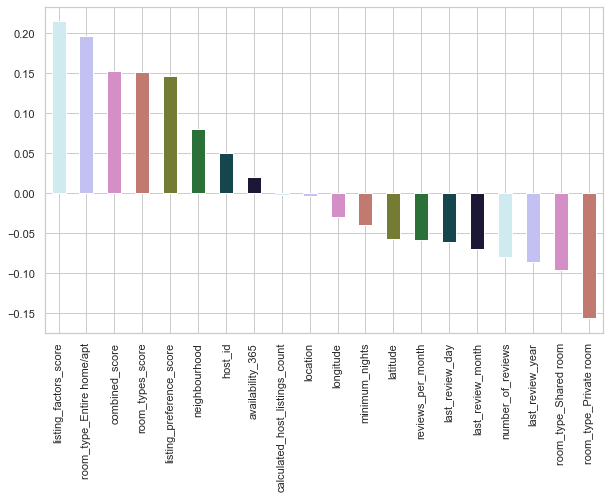

In [148]:
plt.figure(figsize=(10, 6))
central_listings.corr()['price'].sort_values(ascending=False).drop('price').plot(kind='bar', color=palette)
plt.show()

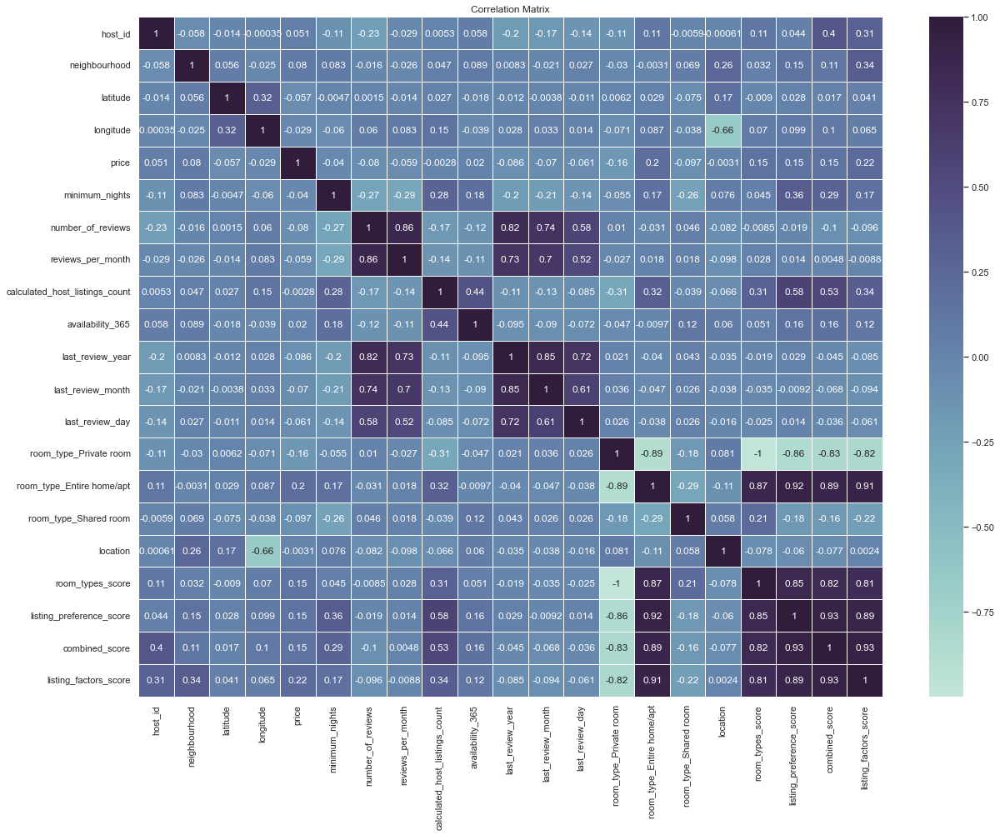

In [149]:
plt.figure(figsize=(20, 15))
sns.heatmap(central_listings.corr(), annot=True, cmap=sns.cubehelix_palette(start=.5, rot=-.5, as_cmap=True), linewidths=0.5, linecolor='white')
plt.title('Correlation Matrix')
plt.show()

In [150]:
# Assuming central_listings is your DataFrame
columns_to_drop = ['latitude','longitude','host_id','neighbourhood','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365','last_review_year','room_type_Private room','room_type_Shared room']
central_listings = central_listings.drop(columns=columns_to_drop, axis=1)

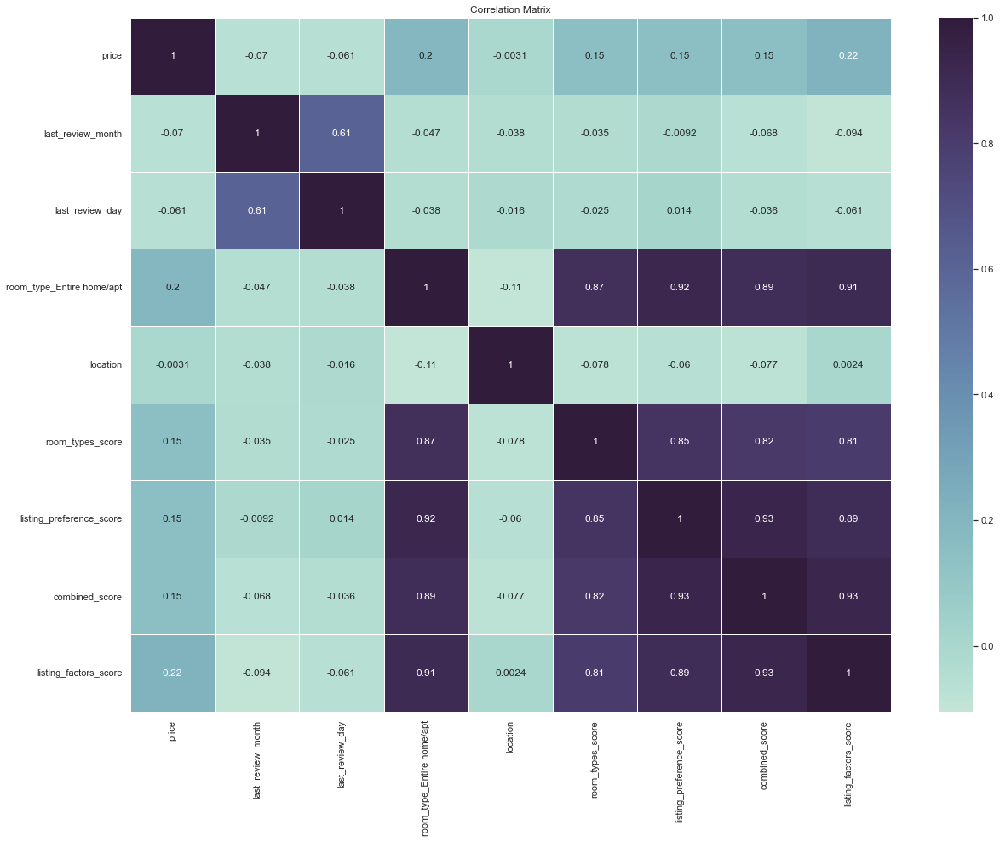

In [151]:
plt.figure(figsize=(20, 15))
sns.heatmap(central_listings.corr(), annot=True, cmap=sns.cubehelix_palette(start=.5, rot=-.5, as_cmap=True), linewidths=0.5, linecolor='white')
plt.title('Correlation Matrix')
plt.show()

### 2.4 Export the data <a id="part2.4"></a>

In [152]:
central_listings.to_csv("central_listings.csv",index=False)